Rainfall Weather Forecasting Project Description Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change. Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:

Problem Statement: a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow. b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.
Dataset Description: Number of columns: 23

Date - The date of observation Location -The common name of the location of the weather station MinTemp -The minimum temperature in degrees celsius MaxTemp -The maximum temperature in degrees celsius Rainfall -The amount of rainfall recorded for the day in mm Evaporation -The so-called Class A pan evaporation (mm) in the 24 hours to 9am Sunshine -The number of hours of bright sunshine in the day. WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight WindDir9am -Direction of the wind at 9am WindDir3pm -Direction of the wind at 3pm WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm Humidity9am -Humidity (percent) at 9am Humidity3pm -Humidity (percent) at 3pm Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm Cloud9am - Fraction of sky obscured by cloud at 9am. Cloud3pm -Fraction of sky obscured by cloud Temp9am-Temperature (degrees C) at 9am Temp3pm -Temperature (degrees C) at 3pm RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0 RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

In [1]:
# Import required libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
df= pd.read_csv("Rainfall.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


### Data Description:

In [3]:
# Checking the dimension of data
print('We have {} rows and {} columns in our dataframe'.format(*df.shape))
print('\n')
# Checking the column names in our dataframe
print('Columns in our dataframe are:\n', df.columns)

We have 8425 rows and 23 columns in our dataframe


Columns in our dataframe are:
 Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


In [4]:
# Checking data datatypes
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [5]:
# Understanding data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

Observations:
    Our dataframe comprises 8425 rows and 23 columns.
    The dataframe contains two datatypes: 16 columns has float values and 7 columns has object values.

### Duplicate Values Analysis & Treatment

In [6]:
# Duplicate Values in our Dataframe
print("Total Duplicate Values in our Dataframe are: ", df.duplicated().sum())

Total Duplicate Values in our Dataframe are:  1663


In [7]:
#Dropping Duplocate values
df.drop_duplicates(keep='last', inplace=True)

In [8]:
# After dropping Duplicate Values checking again
print("Total Duplicate Values in our Dataframe are: ", df.duplicated().sum())

Total Duplicate Values in our Dataframe are:  0


In [9]:
#Checking the dimension of our dataframe
df.shape

(6762, 23)

Observations:
    
Our initial dataframe had 1663 duplicate values.
To address this issue, we removed the duplicate values by dropping the corresponding rows or columns.
As a result of this data cleaning process, there are no remaining duplicate values in the dataframe.
The dimensions of our current dataframe are 6762 rows and 23 columns.

### Missing Values Detection & Treatment

Missing Values Detection

In [10]:
#Checking Missing Values
print("Total Missing Values in our Dataframe are: ", df.isnull().sum().sum())
print('\n')

# Checking for Missing values
missing_values = df.isnull().sum().sort_values(ascending = False)
percentage_missing_values =(missing_values/len(df))*100
print(pd.concat([missing_values, percentage_missing_values], axis =1, keys =['Missing Values', '% Missing data']))

Total Missing Values in our Dataframe are:  16513


               Missing Values  % Missing data
Sunshine                 3236       47.855664
Evaporation              2921       43.197279
Cloud3pm                 1902       28.127773
Cloud9am                 1866       27.595386
Pressure3pm              1311       19.387755
Pressure9am              1308       19.343390
WindGustDir               942       13.930790
WindGustSpeed             942       13.930790
WindDir9am                794       11.742088
WindDir3pm                294        4.347826
Rainfall                  138        2.040816
RainToday                 138        2.040816
RainTomorrow              138        2.040816
WindSpeed3pm              100        1.478852
Humidity3pm                96        1.419698
Temp3pm                    92        1.360544
MinTemp                    70        1.035197
WindSpeed9am               63        0.931677
MaxTemp                    57        0.842946
Humidity9am                5

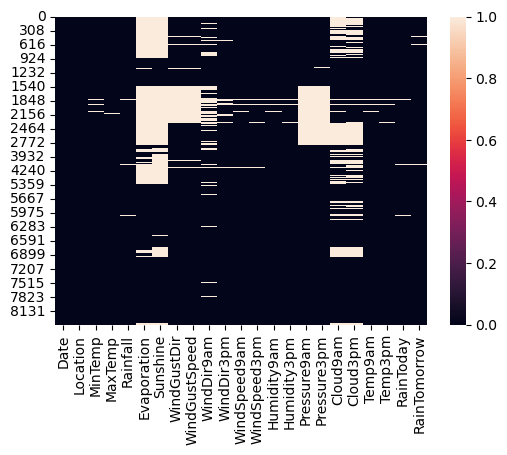

In [11]:
#Visualizing it
plt.figure(figsize=(6,4))
sns.heatmap(df.isnull())
plt.show()

### Seperating Categorical & Numerical columns:

In [12]:
# Separating Numerical & Categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(include=['float64']).columns

print('Categorical columns are: ',categorical_columns)
print('\n')
print('Numerical_columns are: ',numerical_columns)

Categorical columns are:  Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')


Numerical_columns are:  Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')


In [13]:
# Checking missing values in Categorical columns
df[categorical_columns].isnull().sum()


Date              0
Location          0
WindGustDir     942
WindDir9am      794
WindDir3pm      294
RainToday       138
RainTomorrow    138
dtype: int64

In [14]:
# Checking missing values in Numerical columns
df[numerical_columns].isnull().sum()

MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustSpeed     942
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
dtype: int64

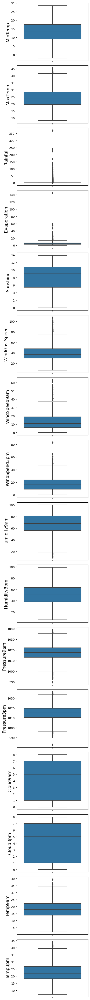

In [18]:
# Visualizing Numerical columns befor missing value imputation
plt.figure(figsize=(8, 3 * len(numerical_columns)))

# Loop through each numerical column and create plots
for i, column in enumerate(numerical_columns):
    plt.subplot(len(numerical_columns), 2, 2 * i + 1)
    sns.boxplot(y=column, data=df)
    plt.ylabel(column, fontsize=15)
    
plt.tight_layout()
plt.show()

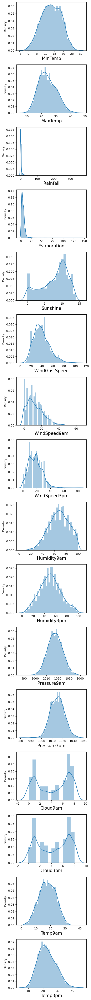

In [19]:
plt.figure(figsize=(8, 3 * len(numerical_columns)))

# Loop through each numerical column and create plots
for i, column in enumerate(numerical_columns):
    plt.subplot(len(numerical_columns), 2, 2 * i + 2)
    sns.distplot(df[column])
    plt.xlabel(column, fontsize=15)

plt.tight_layout()
plt.show()

### Missing Value imputation or Treatment

In [22]:
# Imputation techniques
impute_techniques = {
    'MinTemp': 'mean',
    'MaxTemp': 'median',
    'Rainfall': 'median',
    'Evaporation': 'median',
    'Sunshine': 'mean',
    'WindGustSpeed': 'median',
    'WindSpeed9am': 'median',
    'WindSpeed3pm':'median',
    'Humidity9am': 'median',
    'Humidity3pm': 'mean',
    'Pressure9am': 'median',
    'Pressure3pm': 'median',
    'Cloud9am': 'mean',
    'Cloud3pm': 'mean',
    'Temp9am': 'median',
    'Temp3pm': 'median',
    'WindGustDir' : 'mode',
    'WindDir9am' : 'mode',
    'WindDir3pm' : 'mode',
    'RainToday' : 'mode',
    'RainTomorrow' : 'mode'   
}

# Impute based on defined techniques
for column, technique in impute_techniques.items():
    if technique == 'mode':
        mode_value = df[column].mode()[0]
        df[column].fillna(mode_value, inplace=True)
    elif technique == 'mean':
        mean_value = df[column].mean()
        df[column].fillna(mean_value, inplace=True)
    elif technique == 'median':
        median_value = df[column].median()
        df[column].fillna(median_value, inplace=True)

df.sample(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
7880,2013-09-30,PerthAirport,9.4,17.3,8.8,3.6,10.200000,S,39.0,S,...,54.0,47.0,1016.9,1017.4,4.000000,3.000000,13.8,16.3,Yes,No
1102,2009-09-21,CoffsHarbour,12.6,26.1,0.0,4.4,6.800000,SW,35.0,NNE,...,45.0,75.0,1013.0,1011.3,1.000000,7.000000,24.3,21.7,No,Yes
1378,2010-06-24,CoffsHarbour,12.2,19.1,5.2,1.0,3.600000,WSW,28.0,SW,...,78.0,67.0,1030.4,1026.8,5.000000,7.000000,15.9,17.8,Yes,No
125,2009-04-05,Albury,7.8,21.7,0.0,4.6,7.890896,WSW,31.0,E,...,72.0,37.0,1020.4,1016.5,4.336806,4.320988,12.9,21.2,No,No
4219,2017-04-17,Williamtown,12.8,23.6,0.0,4.6,7.890896,SSE,30.0,WSW,...,76.0,55.0,1023.8,1021.6,1.000000,4.320988,18.4,22.5,No,No


In [23]:
# Checking missing values are imputation
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

Observations:
    
Total Missing Values in the Dataframe: There are a total of 16,513 missing values in the dataset.

### Statistical Analysis

In [24]:
# Statistical Summary
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.00000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.109145,24.093301,2.723410,4.99898,7.890896,38.702159,12.765602,17.562703,67.510500,50.467147,1017.621222,1015.116060,4.336806,4.320988,17.895830,22.700281
std,5.540667,6.130367,10.490138,3.36177,2.733639,13.393977,9.789075,9.548883,17.182756,18.498341,6.027923,5.967643,2.474649,2.323276,5.722418,5.972262
min,-2.000000,8.200000,0.000000,0.00000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,4.00000,7.890896,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.109145,23.500000,0.000000,4.60000,7.890896,37.000000,11.000000,17.000000,68.000000,50.000000,1017.600000,1015.100000,4.336806,4.320988,18.000000,22.100000
75%,17.400000,28.400000,0.800000,5.00000,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.00000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


### Data Visualization

Exploring of our target columns: (Rain Prediction)

In [25]:
# Calculate value counts for our target
value_counts = df.RainTomorrow.value_counts()

# Calculate percentages
percentages = (value_counts / len(df)) * 100

# Combine value counts and percentages into a DataFrame
Rainfall = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})

# Print the result DataFrame
print(Rainfall)


     Count  Percentage
No    5190    76.75244
Yes   1572    23.24756


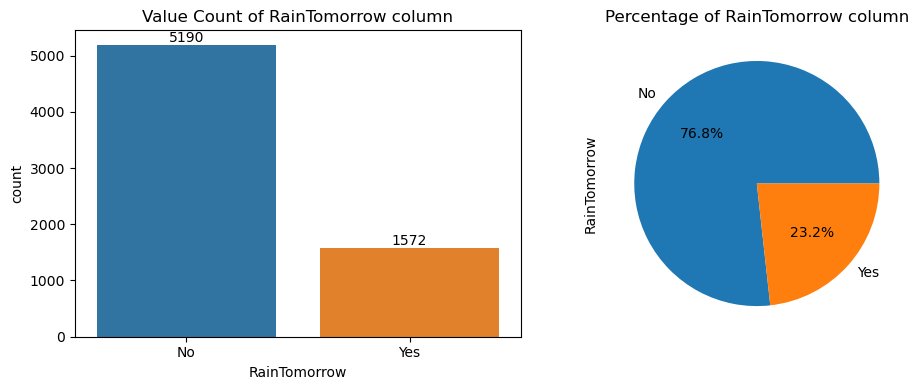

In [26]:
# Visualizing it:
fig, axes = plt.subplots(1,2,figsize=(10,4))

# First plot: Value count of the column using count plot
ax = sns.countplot(x='RainTomorrow', data=df, ax=axes[0])
for container in ax.containers:
    ax.bar_label(container)
axes[0].set_title('Value Count of RainTomorrow column')

# Second plot: Percentage of RainTomorrow column
df['RainTomorrow'].value_counts().plot(kind="pie", autopct="%0.1f%%", ax=axes[1])
axes[1].set_title('Percentage of RainTomorrow column')

plt.tight_layout()
plt.show()

The "RainTomorrow" column represents whether it will rain tomorrow, with two possible values: "No" and "Yes." Among the 6762 records, "No" occurs 5190 times, accounting for approximately 76.75% of the data, while "Yes" appears 1572 times, representing approximately 23.25% of the data.

### Exploring of our target columns: (Rainfall Amount Prediction)

In [27]:
df.Rainfall.value_counts()

0.0      4472
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0       1
40.0        1
Name: Rainfall, Length: 250, dtype: int64

The dataset also includes various other rainfall amounts, such as 0.2 mm (321 occurrences), 0.4 mm (144 occurrences), 0.6 mm (87 occurrences), and 1.2 mm (69 occurrences), among others.

In [28]:
# finding details about minimum and maximum Rainfall amount
print('Minimum Capacity of Rainfall amount:',df.Rainfall.min())
print('Maximum Capacity of Rainfall amount:',df.Rainfall.max())

Minimum Capacity of Rainfall amount: 0.0
Maximum Capacity of Rainfall amount: 371.0


In [29]:
# checking Smallest & Biggest Powerplant in our dataframe
df.loc[(df['Rainfall'] == 371.0)]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
1149,2009-11-07,CoffsHarbour,17.4,23.1,371.0,4.6,3.5,E,37.0,SW,...,93.0,81.0,1026.6,1025.9,8.0,5.0,18.6,22.0,Yes,Yes


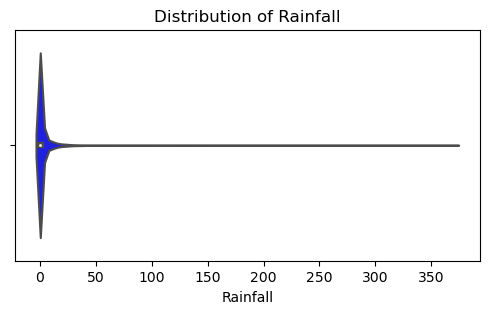

In [30]:
# Visualizing It
plt.figure(figsize=(6,3))
sns.violinplot(x='Rainfall', data=df, color='blue')
plt.title('Distribution of Rainfall')
plt.show()

In [31]:
df.loc[df.Rainfall >25].shape

(160, 23)

In [32]:
#Exploring all the categorical columns
for i in categorical_columns[:-1]:
    counts = df[i].value_counts()
    percentage = (counts / len(df)) * 100
    print(f"Column Name: {i}")
    print(pd.concat([counts, percentage], axis =1, keys =['Values', 'Percentage']))
    print('='*50)

Column Name: Date
            Values  Percentage
2011-02-11       4    0.059154
2011-02-18       4    0.059154
2011-03-18       4    0.059154
2011-03-19       4    0.059154
2011-03-20       4    0.059154
...            ...         ...
2016-11-03       1    0.014789
2016-11-02       1    0.014789
2016-11-01       1    0.014789
2016-10-31       1    0.014789
2013-06-08       1    0.014789

[3004 rows x 2 columns]
Column Name: Location
              Values  Percentage
PerthAirport    1204   17.805383
Albury           907   13.413191
Newcastle        822   12.156167
Melbourne        811   11.993493
Williamtown      615    9.094942
CoffsHarbour     611    9.035788
Brisbane         579    8.562555
Penrith          482    7.128069
Darwin           250    3.697131
Wollongong       237    3.504880
Adelaide         205    3.031647
Uluru             39    0.576752
Column Name: WindGustDir
     Values  Percentage
E      1460   21.591245
SW      465    6.876664
N       459    6.787933
W       434  

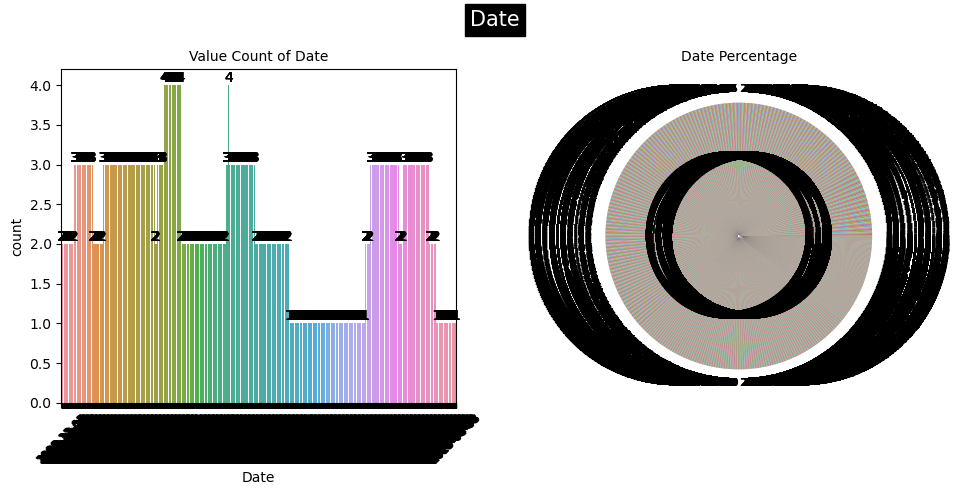

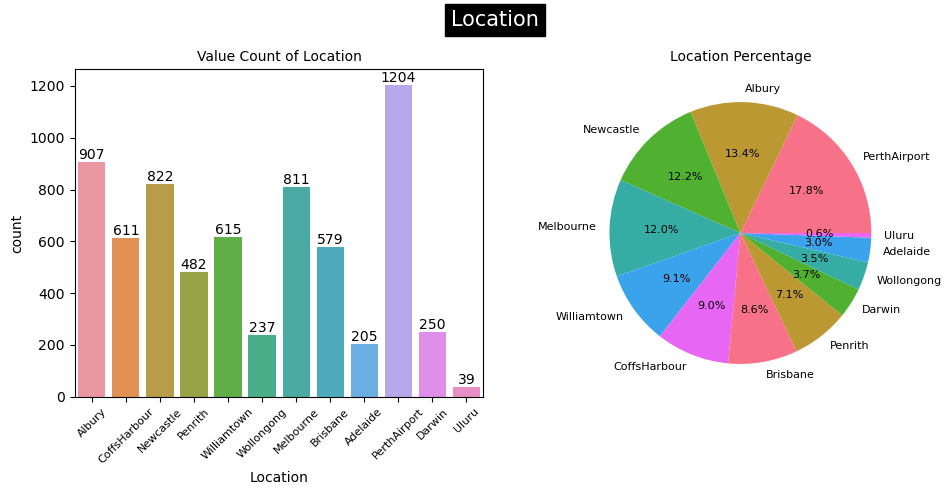

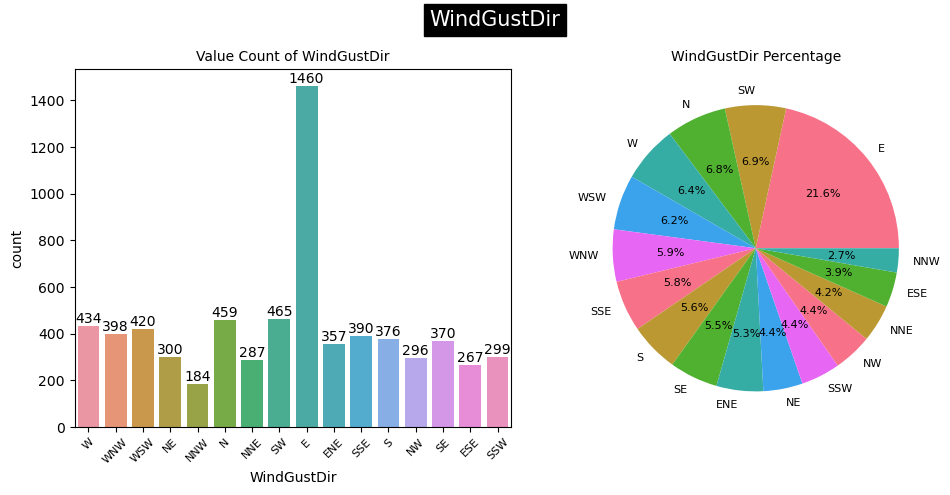

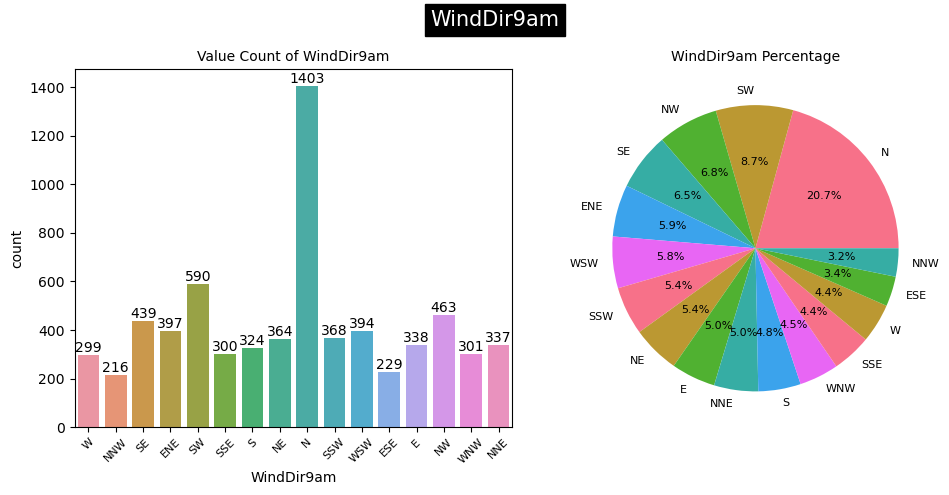

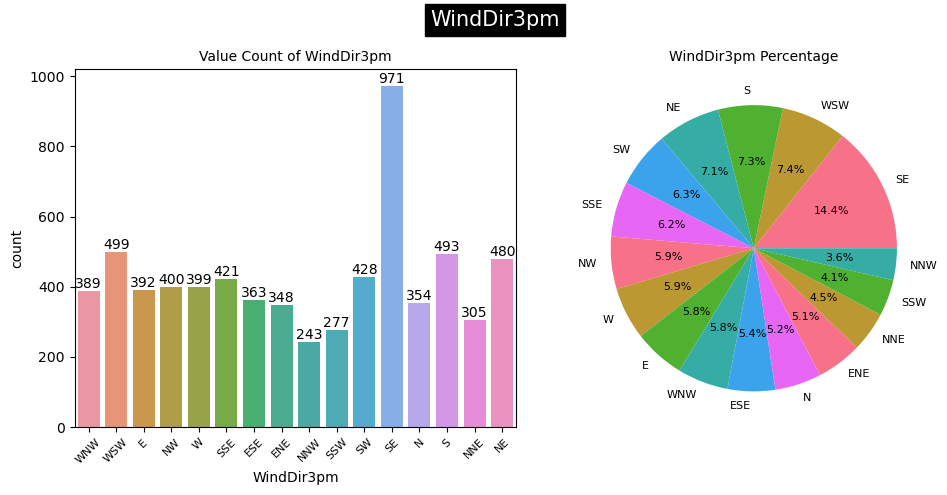

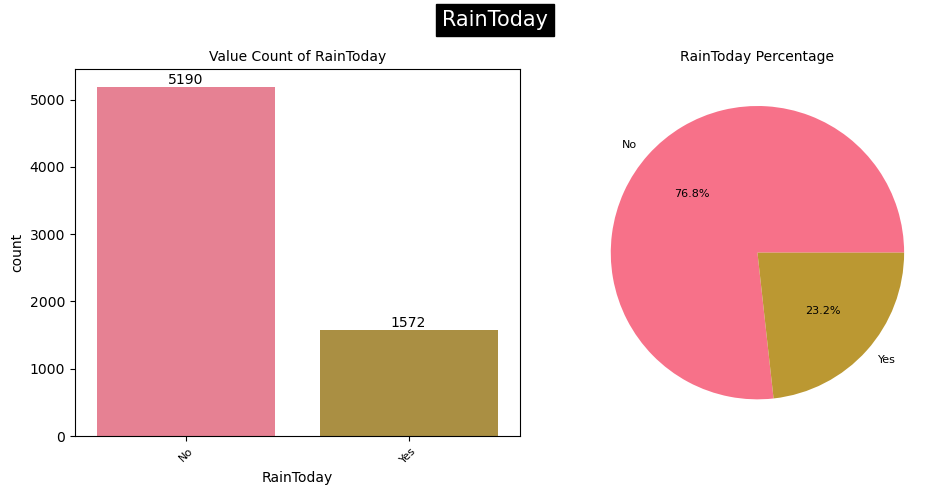

In [33]:
#Visualizing it
cat_col = categorical_columns[:-1]

#Iterate over Categorical column
for i, column in enumerate(cat_col):
    
    fig, axes = plt.subplots(1, 2, figsize=(10,5))
    sns.set_palette("husl")
    
    # Plot the countplot
    ax = sns.countplot(x=column, data=df, ax=axes[0])
    for container in ax.containers:
        ax.bar_label(container)
    ax.set_title(f'Value Count of {column}', fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=8)

    # Plot the pie chart
    column_counts = df[column].value_counts()
    ax = axes[1]
    ax.pie(column_counts, labels=column_counts.index, autopct='%0.1f%%', textprops={'fontsize': 8})
    ax.set_title(f'{column} Percentage', fontsize=10)
    
    fig.suptitle(column, fontsize=15, backgroundcolor='black',color='white')
    plt.tight_layout()
    plt.show()


In [34]:
#Exploring Numerical Columns
for i in numerical_columns:
    counts = df[i].value_counts()
    percentage = (counts / len(df)) * 100
    print(f"Column Name: {i}")
    print(pd.concat([counts, percentage], axis =1, keys =['Values', 'Percentage']))
    print('='*50)

Column Name: MinTemp
            Values  Percentage
 13.109145      70    1.035197
 13.200000      58    0.857734
 12.000000      57    0.842946
 14.800000      53    0.783792
 12.700000      53    0.783792
...            ...         ...
-1.200000        1    0.014789
-1.500000        1    0.014789
-1.700000        1    0.014789
-0.800000        1    0.014789
 26.000000       1    0.014789

[286 rows x 2 columns]
Column Name: MaxTemp
      Values  Percentage
23.5      99    1.464064
19.0      66    0.976043
19.8      62    0.916888
22.3      54    0.798580
23.8      54    0.798580
...      ...         ...
38.9       1    0.014789
10.3       1    0.014789
9.4        1    0.014789
42.5       1    0.014789
43.5       1    0.014789

[331 rows x 2 columns]
Column Name: Rainfall
       Values  Percentage
0.0      4472   66.134280
0.2       321    4.747116
0.4       144    2.129547
0.6        87    1.286602
1.2        69    1.020408
...       ...         ...
73.8        1    0.014789
23.8    

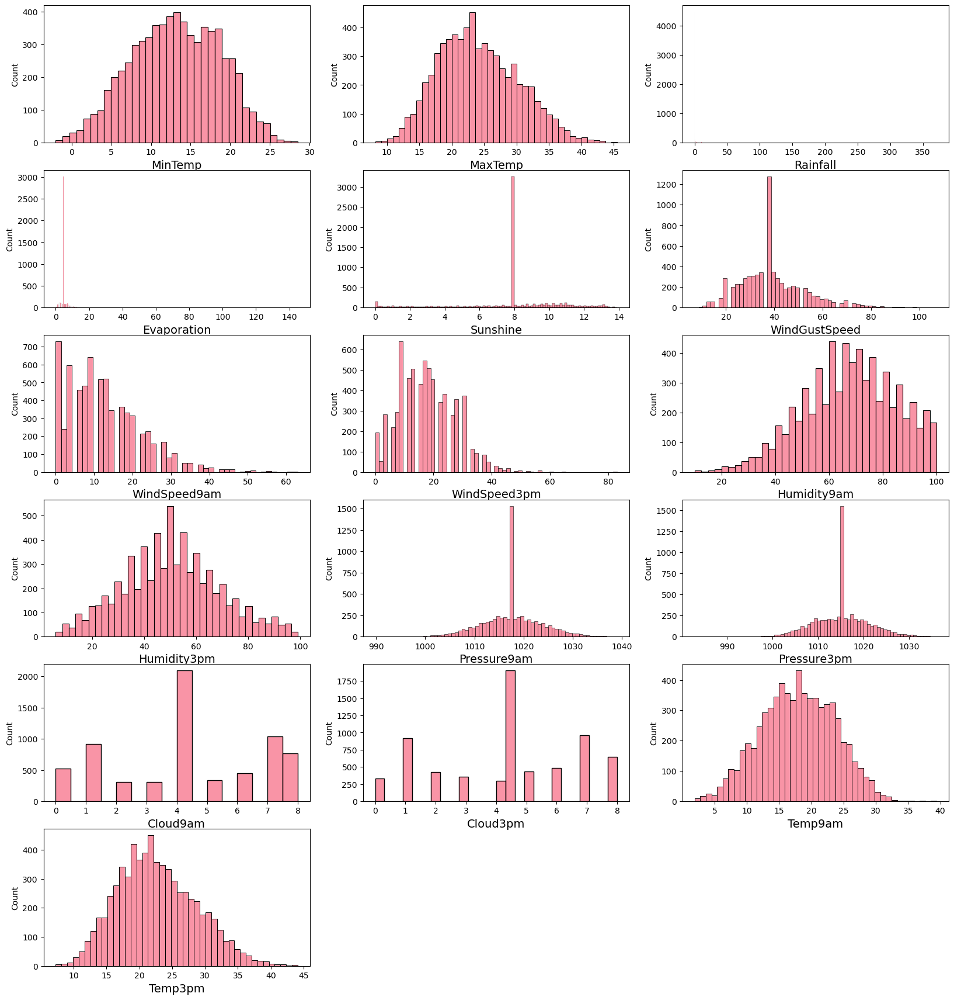

In [35]:
#Visiualizing it using Histogram
plt.figure(figsize=(20,25), facecolor='white')
plotnumber =1
for column in numerical_columns:
    if plotnumber <=20:
        ax = plt.subplot(7,3,plotnumber)
        sns.histplot(df[column])
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.show()


# Bivariate Analysis

comparing All categorical columns with our first target Rain Prediction

In [38]:
cat_col = categorical_columns[:-1]

# Iterate through each categorical column
for col in cat_col:
    
    # Group by 'Income' and the current categorical column
    Income_counts = df.groupby(['RainTomorrow', col])[col].count()
    
    # Calculate the total count for each category in the current column
    total_counts = df.groupby(col)['RainTomorrow'].count()
    
    # Calculate the percentage of 'Income' for each category in the current column
    Income_percentages = (Income_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    Income_df = pd.concat([Income_counts, Income_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(Income_df)
    print('-'*60)

                         Count  Percentage
RainTomorrow Date                         
No           2008-12-01      2       100.0
             2008-12-02      2       100.0
             2008-12-03      2       100.0
             2008-12-04      2       100.0
             2008-12-05      2       100.0
...                        ...         ...
Yes          2017-06-11      1        50.0
             2017-06-12      1        50.0
             2017-06-13      1        50.0
             2017-06-14      1        50.0
             2017-06-18      1        50.0

[3989 rows x 2 columns]
------------------------------------------------------------
                           Count  Percentage
RainTomorrow Location                       
No           Adelaide        160       78.05
             Albury          708       78.06
             Brisbane        444       76.68
             CoffsHarbour    425       69.56
             Darwin          218       87.20
             Melbourne       608       7

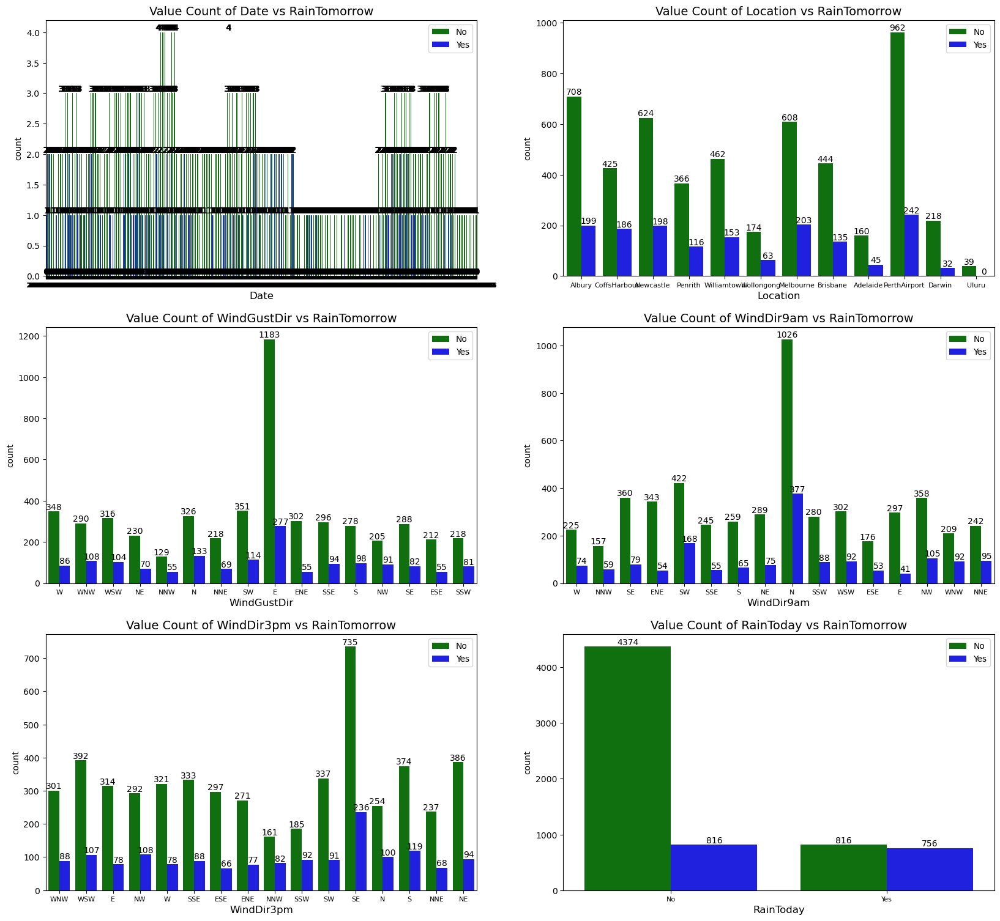

In [37]:
# Visualization of Categorical column Vs RainTomorrow
plt.figure(figsize=(20,25))
p=1

for i in cat_col:
    if p<=8:
        plt.subplot(4,2,p)
        custom_palette = {"Yes": "Blue", "No": "green"}
        ax= sns.countplot(x=i, hue='RainTomorrow',data=df, palette=custom_palette)
        for container in ax.containers:
            ax.bar_label(container)
        plt.title(f'Value Count of {i} vs RainTomorrow', fontsize=14)
        plt.xlabel(i, fontsize=12)
        plt.xticks(fontsize=8)
        plt.legend()
    p+=1
plt.show()

comparing All categorical columns with our second target Rainfall

In [39]:
cat_col = categorical_columns[:-1]

# Iterate through each categorical column
for col in cat_col:
    
    # Group by 'Income' and the current categorical column
    Income_counts = df.groupby(['RainTomorrow', col])[col].count()
    
    # Calculate the total count for each category in the current column
    total_counts = df.groupby(col)['RainTomorrow'].count()
    
    # Calculate the percentage of 'Income' for each category in the current column
    Income_percentages = (Income_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    Income_df = pd.concat([Income_counts, Income_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(Income_df)
    print('-'*60)

                         Count  Percentage
RainTomorrow Date                         
No           2008-12-01      2       100.0
             2008-12-02      2       100.0
             2008-12-03      2       100.0
             2008-12-04      2       100.0
             2008-12-05      2       100.0
...                        ...         ...
Yes          2017-06-11      1        50.0
             2017-06-12      1        50.0
             2017-06-13      1        50.0
             2017-06-14      1        50.0
             2017-06-18      1        50.0

[3989 rows x 2 columns]
------------------------------------------------------------
                           Count  Percentage
RainTomorrow Location                       
No           Adelaide        160       78.05
             Albury          708       78.06
             Brisbane        444       76.68
             CoffsHarbour    425       69.56
             Darwin          218       87.20
             Melbourne       608       7

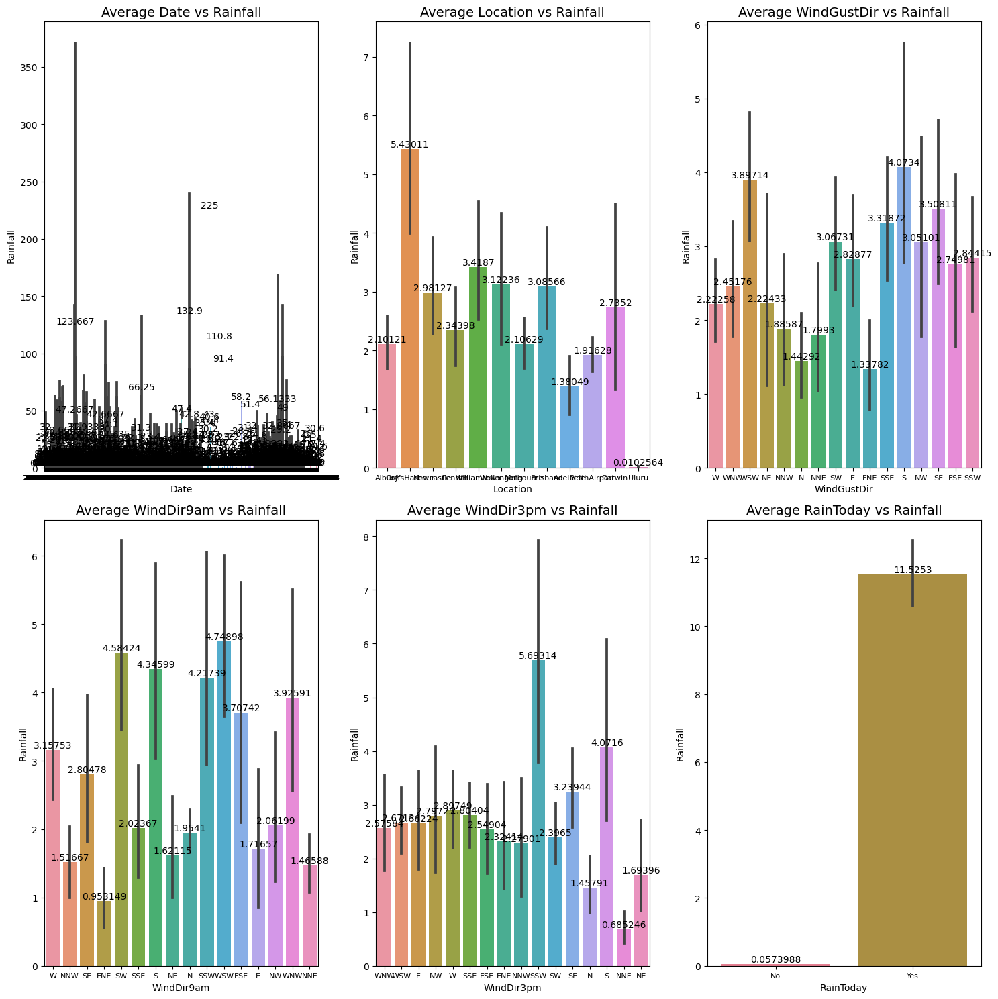

In [41]:
# Visualization of Categorical column Vs Rainfall
plt.figure(figsize=(15, 15))
p = 1

for i in categorical_columns:
    if p <= 6:
        plt.subplot(2, 3, p)
        ax = sns.barplot(x=i, y='Rainfall', data=df)
        for container in ax.containers:
            ax.bar_label(container)
        plt.title(f'Average {i} vs Rainfall', fontsize=14)
        plt.xticks(fontsize=8)
    p += 1

plt.tight_layout()
plt.show()

comparing All numerical columns with our first target Rain Prediction

In [42]:
# Iterate through each numerical column
for col in numerical_columns:
    # Group by 'RainTommorrow' and the current numerical column
    RainTomorrow_counts = df.groupby(['RainTomorrow', col])[col].count()
    
    # Calculate the total count for each numeric in the current column
    total_counts = df.groupby(col)['RainTomorrow'].count()
    
    # Calculate the percentage of 'RainTomorrow' for each category in the current column
    RainTomorrow_percentages = (RainTomorrow_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    RainTomorrow_df = pd.concat([RainTomorrow_counts, RainTomorrow_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(RainTomorrow_df)
    print('\n')

                      Count  Percentage
RainTomorrow MinTemp                   
No           -2.0         2      100.00
             -1.7         1      100.00
             -1.5         1      100.00
             -1.4         1      100.00
             -1.3         2      100.00
...                     ...         ...
Yes           25.6        1       33.33
              25.8        2       66.67
              25.9        1      100.00
              26.2        1       33.33
              27.0        2      100.00

[525 rows x 2 columns]


                      Count  Percentage
RainTomorrow MaxTemp                   
No           8.2          1      100.00
             8.3          1      100.00
             9.4          1      100.00
             9.6          2      100.00
             9.8          1       33.33
...                     ...         ...
Yes          40.3         1       25.00
             41.4         1      100.00
             41.5         1       50.00
             4

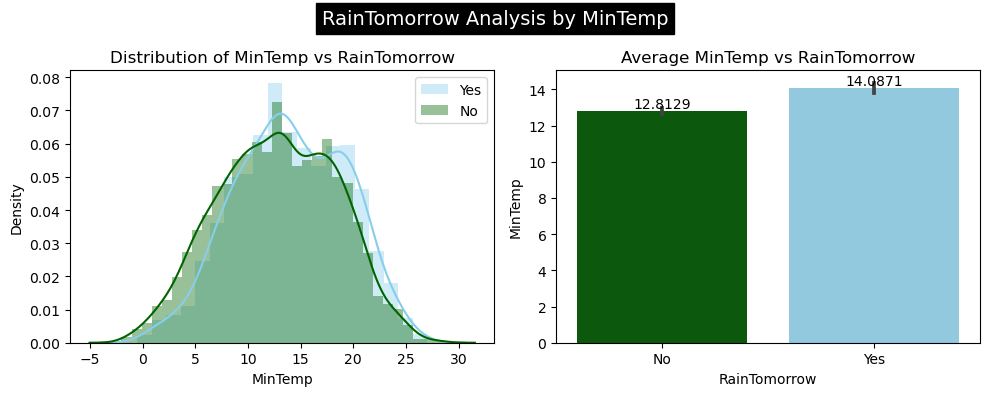

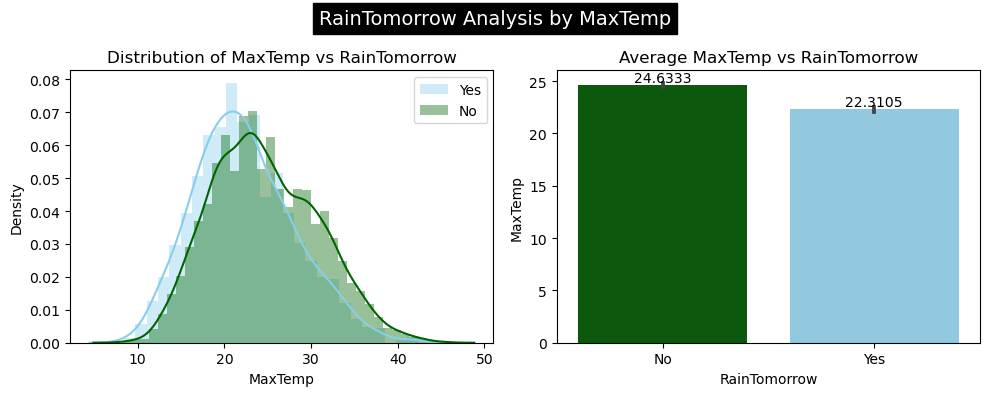

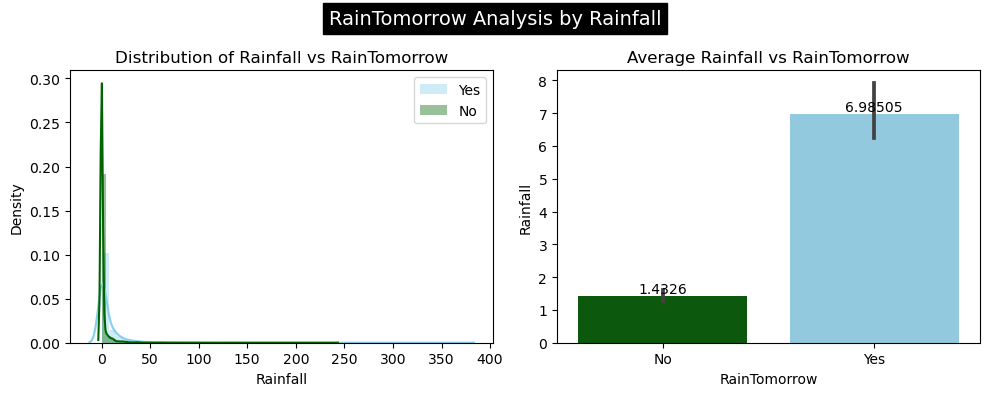

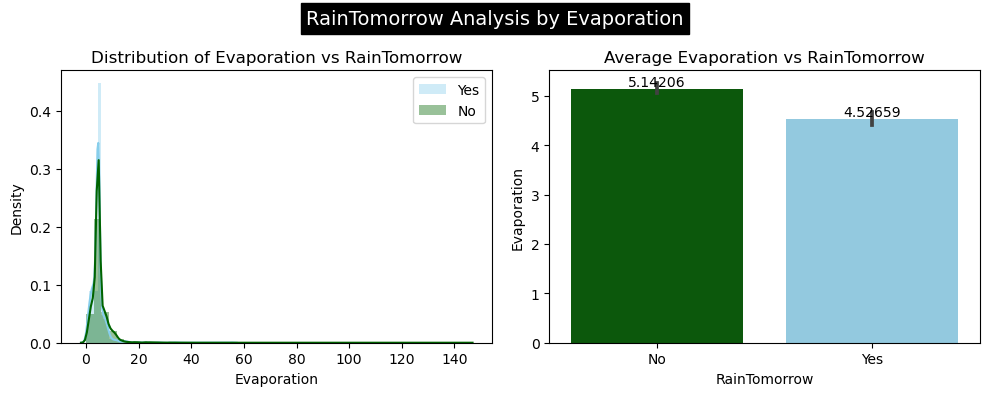

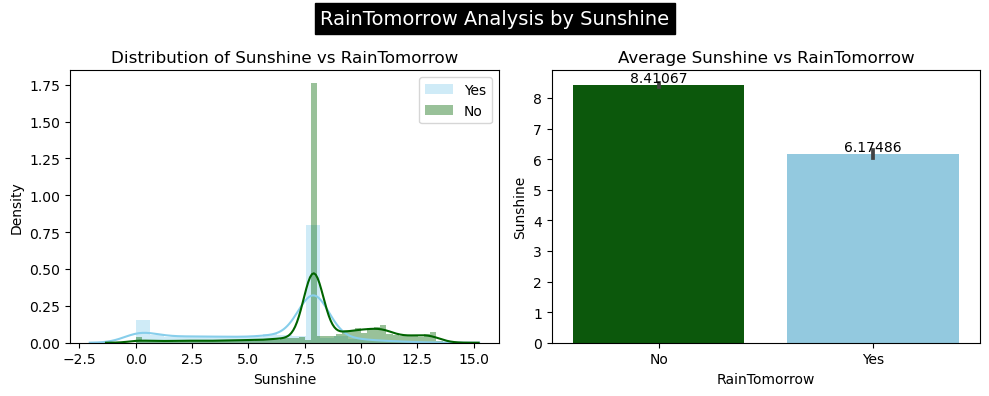

...

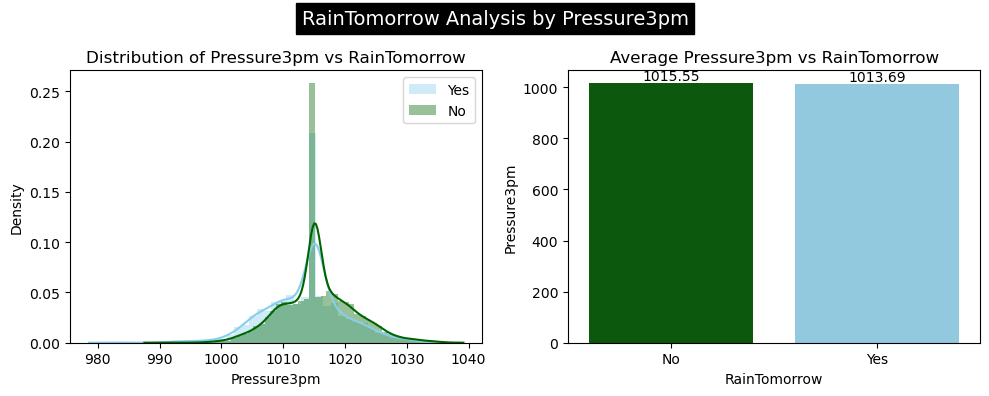

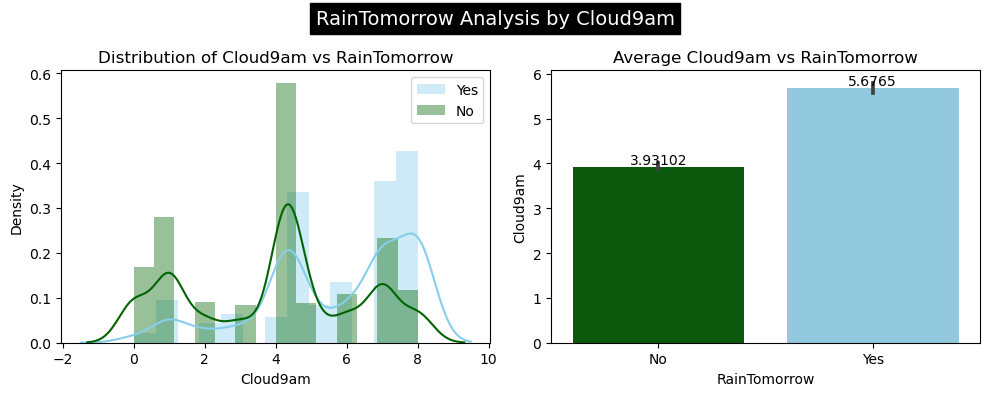

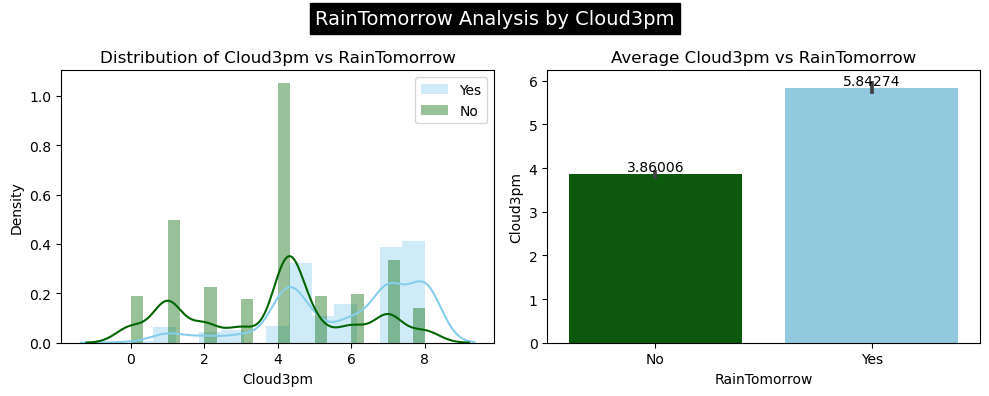

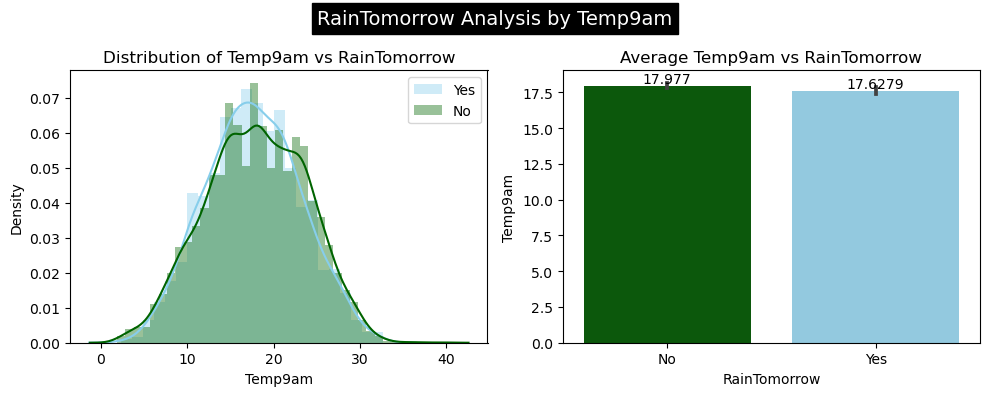

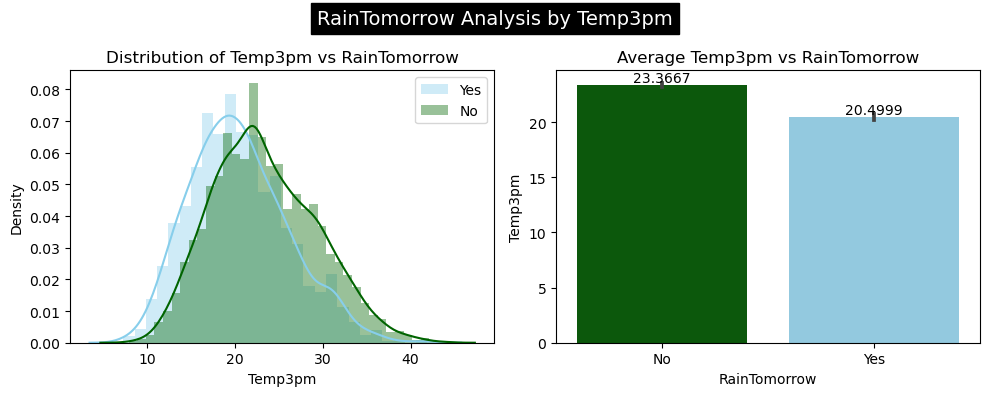

In [43]:
# Visualizing it:
for i in numerical_columns:
    
    #create Subplots
    fig, axes =plt.subplots(1,2,figsize=(10,4))
    
    # First Plot: Distribution of Numerical columns vs RainTomorrow
    sns.distplot(df[df['RainTomorrow']=="Yes"][i], label= "Yes", color='skyblue', ax=axes[0])
    sns.distplot(df[df['RainTomorrow']=="No"][i],label="No", color='Darkgreen', ax=axes[0])
    axes[0].set_title(f"Distribution of {i} vs RainTomorrow")
    axes[0].legend()
    
    # Second Plot: Avg. Numerical columns vs Income
    ax=sns.barplot(x='RainTomorrow', y=i, data=df, palette={"Yes": "skyblue", "No": "Darkgreen"}, ax=axes[1])
    for container in ax.containers:
        ax.bar_label(container)
    axes[1].set_title(f'Average {i} vs RainTomorrow')
    
    fig.suptitle(f"RainTomorrow Analysis by {i}", fontsize=14, backgroundcolor='black',color='white')
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    # Show the plots
    plt.show()

comparing All numerical columns with our second target Rainfall

In [44]:
# Iterate through each numerical column
for col in numerical_columns:
    
    # Group by 'Rainfall' and the current categorical column
    Rainfall_counts = df.groupby(['Rainfall', col])[col].count()
    
    # Calculate the total count for each category in the current column
    total_counts = df.groupby(col)['Rainfall'].count()
    
    # Calculate the percentage of 'Rainfall' for each category in the current column
    Rainfall_percentages = (Rainfall_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    Rainfall_df = pd.concat([Rainfall_counts, Rainfall_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(Rainfall_df)
    print('*'*60)

                     Count  Percentage
Rainfall MinTemp                      
0.0      -2.000000       2      100.00
         -1.700000       1      100.00
         -1.500000       1      100.00
         -1.400000       1      100.00
         -1.300000       2      100.00
...                    ...         ...
142.2     24.100000      1       16.67
168.4     21.300000      1        4.76
225.0     18.500000      1        2.27
240.0     13.109145      1        1.43
371.0     17.400000      1        4.35

[2253 rows x 2 columns]
************************************************************
                  Count  Percentage
Rainfall MaxTemp                   
0.0      8.2          1      100.00
         8.3          1      100.00
         8.4          1      100.00
         8.8          1       50.00
         9.4          1      100.00
...                 ...         ...
142.2    29.8         1        2.63
168.4    26.6         1        3.70
225.0    19.9         1        2.78
240.0    21

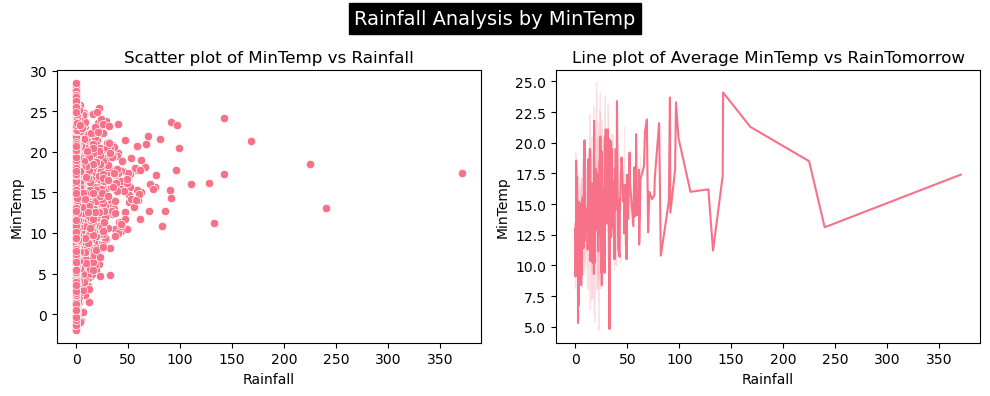

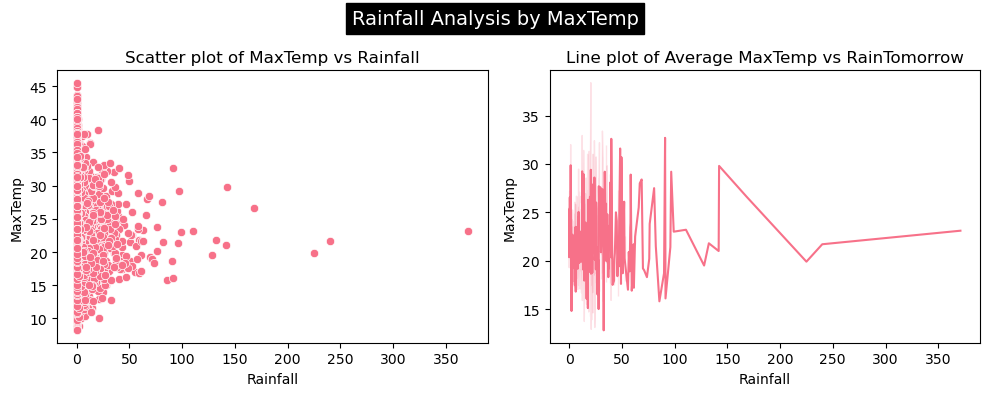

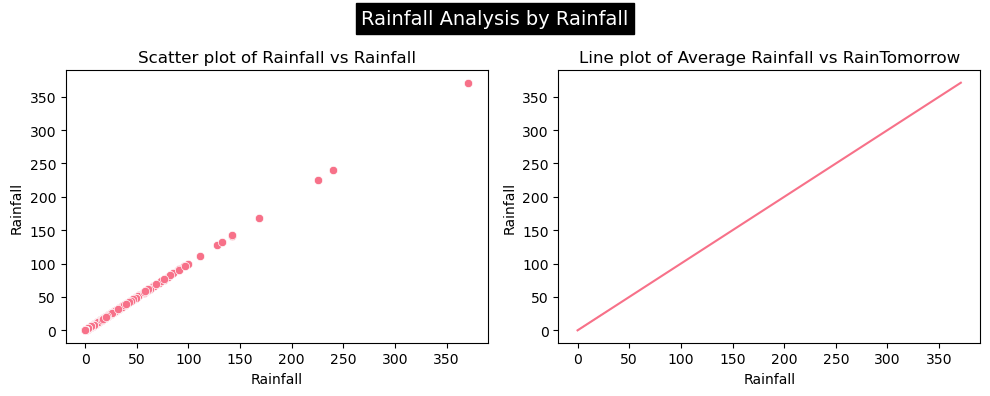

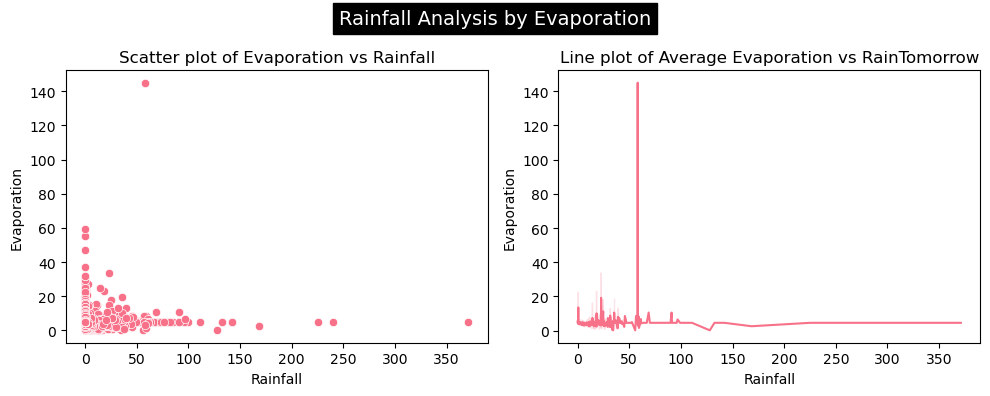

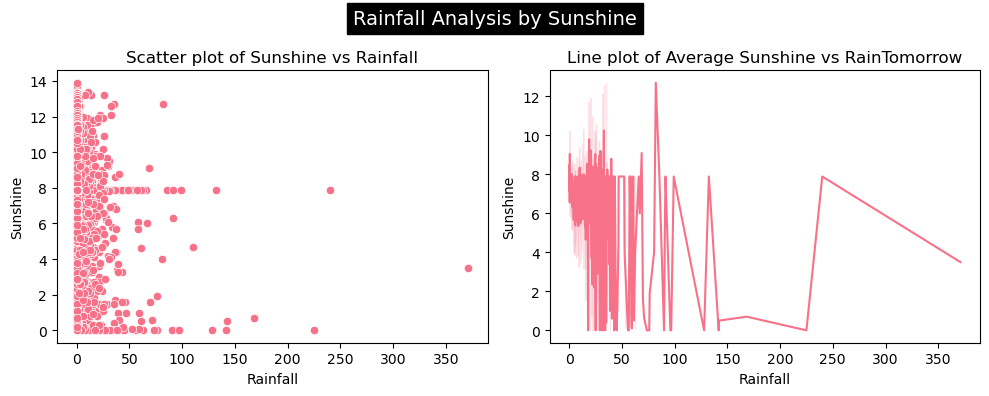

...

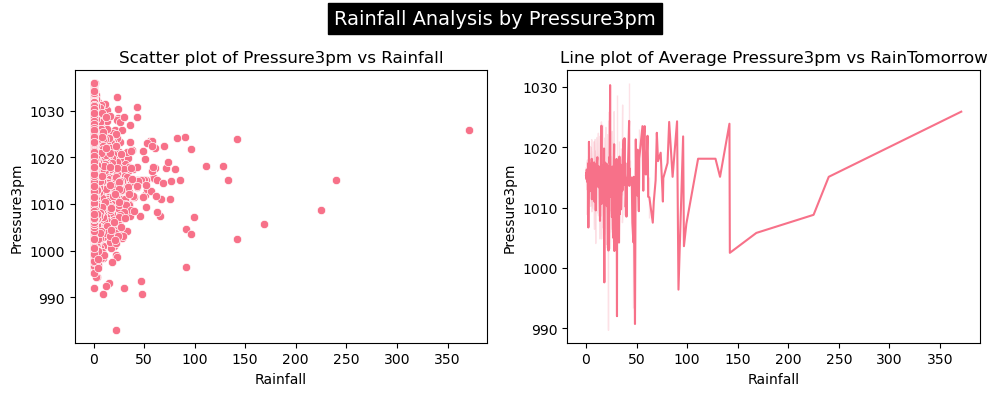

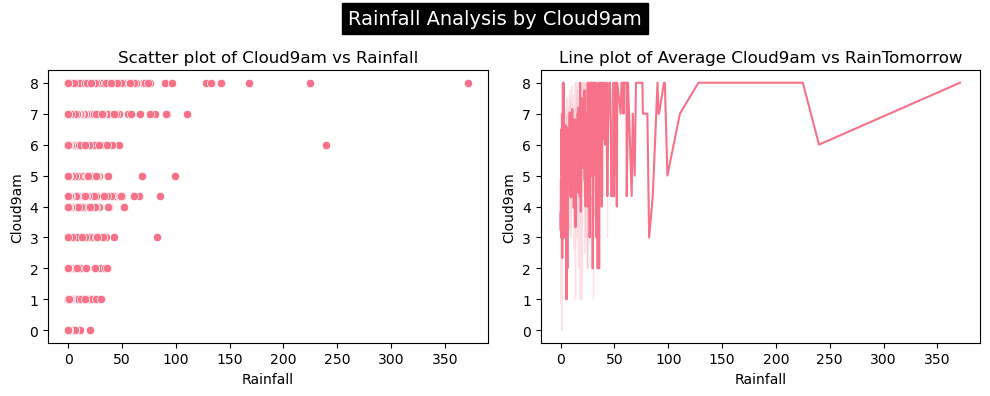

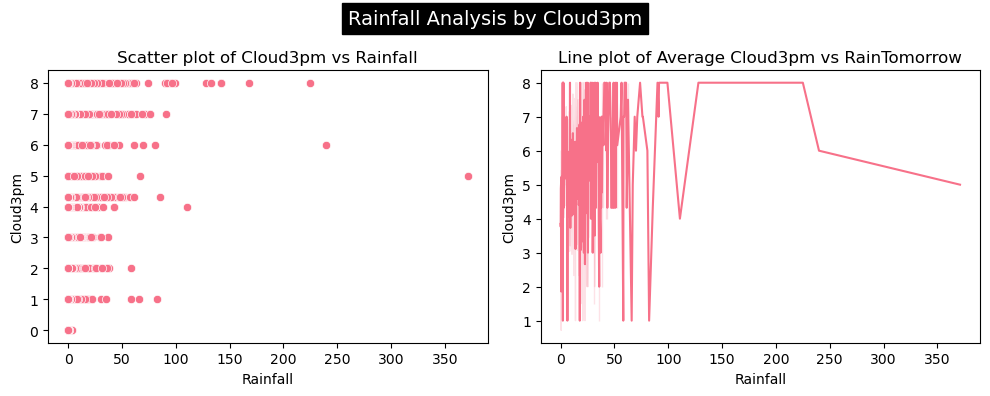

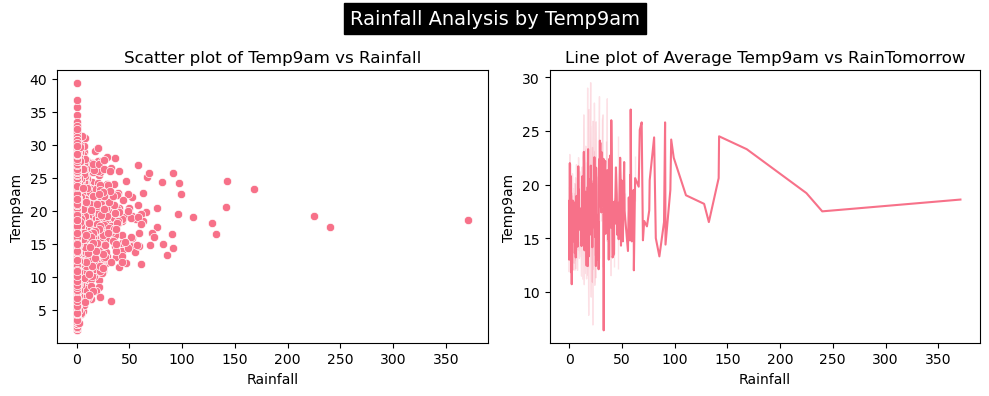

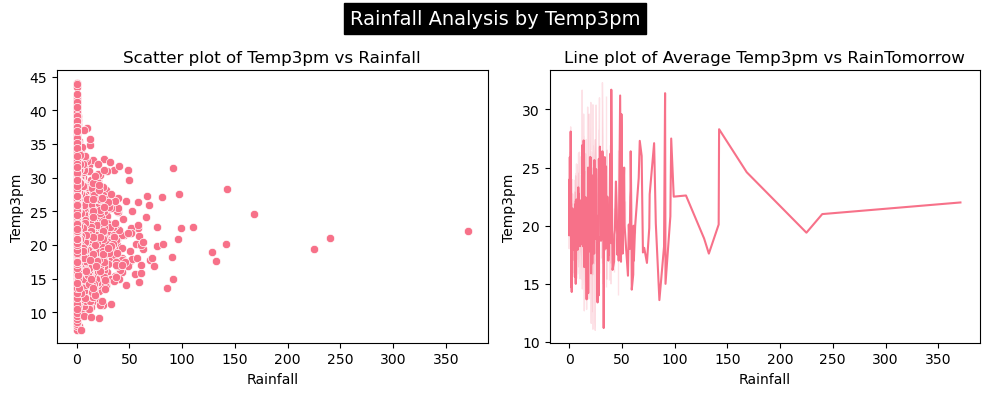

In [45]:
# Visualizing it:
for i in numerical_columns:
    
    # Create Subplots
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    
    # First Plot: Scatter plot of Numerical columns vs Rainfall
    sns.scatterplot(x='Rainfall', y=i, data=df, ax=axes[0])
    axes[0].set_title(f"Scatter plot of {i} vs Rainfall")
    
    # Second Plot: Line plot of Avg. Numerical columns vs Rainfall
    ax = sns.lineplot(x='Rainfall', y=i, data=df,  ax=axes[1])
    axes[1].set_title(f'Line plot of Average {i} vs RainTomorrow')
    
    fig.suptitle(f"Rainfall Analysis by {i}", fontsize=14, backgroundcolor='black', color='white')
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    # Show the plots
    plt.show()

comparing our both target Rainfall and Raintommorrow

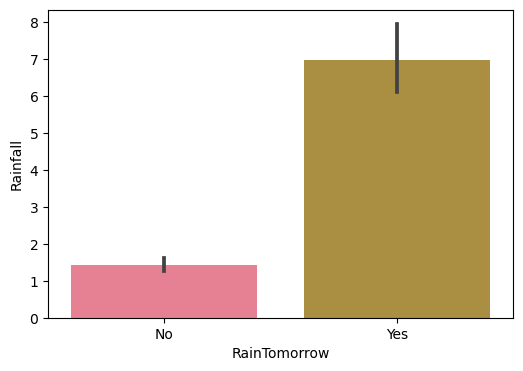

In [46]:
# RainTomorrow Vs Rainfall
plt.figure(figsize=(6,4))
sns.barplot(x=df['RainTomorrow'], y=df['Rainfall'])
plt.show()


### Multivariate Analysis

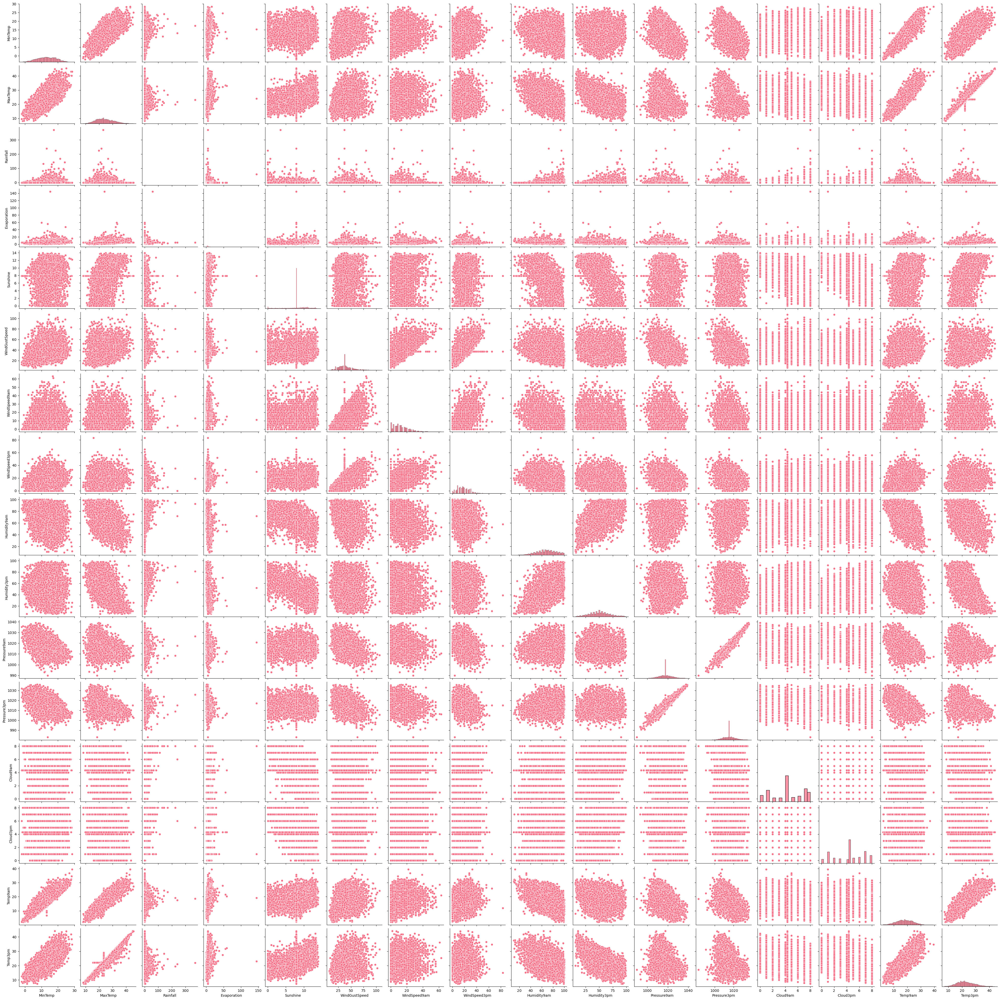

In [47]:
sns.pairplot(df)
plt.show()

#### Outlier Detection:

In [51]:
# Outlier Treatment, Peprocessor, Scaler
from scipy.stats import zscore
from sklearn.preprocessing import LabelEncoder, StandardScaler, PowerTransformer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE


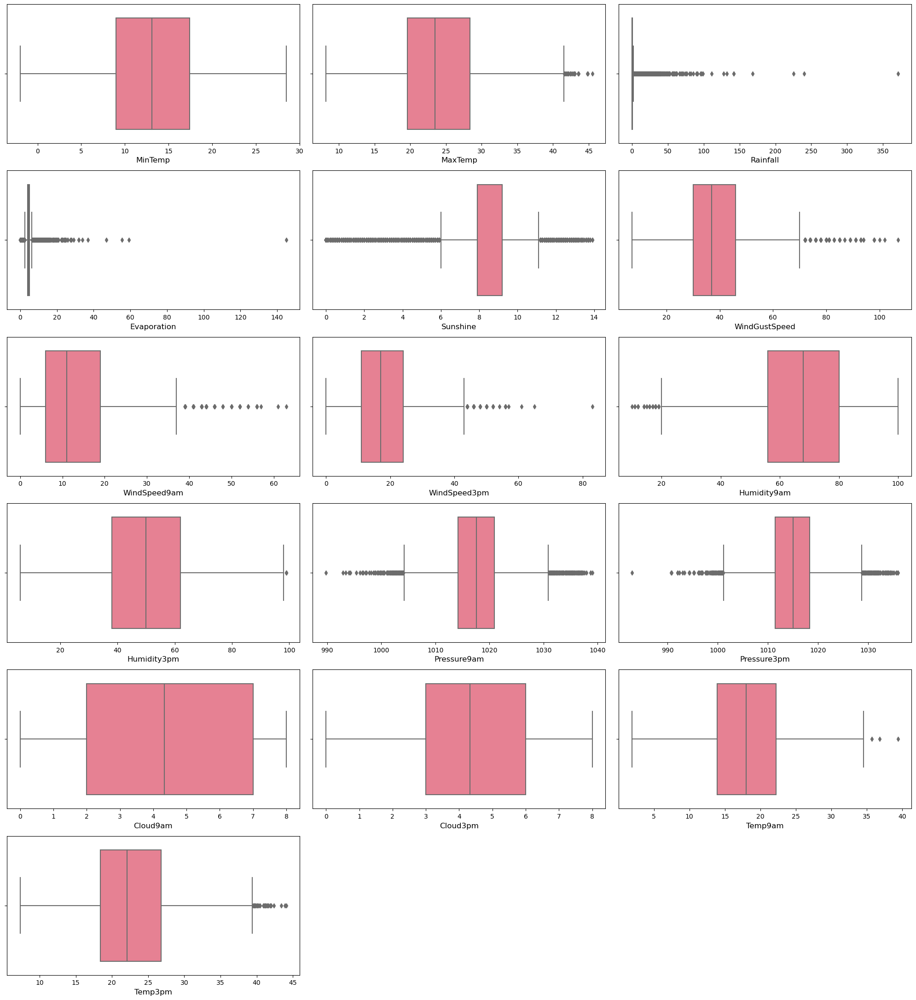

In [49]:
# Identifying the outliers present in numerical columns using boxplot
plt.figure(figsize=(20,25))
plotnumber=1
for col in numerical_columns:
    if plotnumber<=20:
        ax=plt.subplot(7,3,plotnumber)
        sns.boxplot(x=col, data=df)
        plt.xlabel(col,fontsize=12)
    plotnumber+=1
plt.tight_layout()

Zscore Treatment

In [52]:
# Creating a list with Columns which has outliers
outlier_columns=['MaxTemp', 'Rainfall', 'Evaporation',
                 'Sunshine','WindGustSpeed', 'WindSpeed9am',
                 'WindSpeed3pm', 'Humidity9am','Humidity3pm',
                 'Pressure9am', 'Pressure3pm','Temp9am', 'Temp3pm',]


# Calculate the z-scores for the specified numerical columns
z = np.abs(zscore(df[outlier_columns]))

# Create a new DataFrame df1 with rows where z-scores are less than 3 for all numerical columns
df1 = df[(z < 3).all(axis=1)]
df1.shape

(6405, 23)

In [53]:
#IQR Technique
df2 = df.copy()

for column in outlier_columns:
    IQR = df2[column].quantile(0.75)-df2[column].quantile(0.25)
    lower_bridge = df2[column].quantile(0.25) - (IQR * 1.5)
    upper_bridge = df2[column].quantile(0.75) + (IQR * 1.5)
    
    # Remove outliers
    df2 = df2[~((df2[column] < lower_bridge) | (df2[column] > upper_bridge))]

# Print the shape of the DataFrame after outlier removal
print("Shape after outlier removal:", df2.shape)

Shape after outlier removal: (2351, 23)


Data loss Calculation

In [54]:
# checking the data loss for zscore
data_loss_zscore = (6762-6405)/6405*100
print('Dataloss using zscore:',data_loss_zscore)

# checking the data loss for IQR
data_loss_IQR = (6405-2351)/6405*100
print('Dataloss using IQR:',data_loss_IQR)

Dataloss using zscore: 5.573770491803279
Dataloss using IQR: 63.294301327088206


in IQR data loss is very high so we are chosing Zscore 

In [55]:
# Choosing zscore for outlier treatment
df=df1

# Checking the shape of our dataframe after removing outliers using Zscore
df.shape

(6405, 23)

In [56]:
#Saving Clean Data
file_path = "clean_data_Rainfall.csv"
df.to_csv(file_path, index=False)

### skewness detection & Treatment


In [57]:
df.skew()

MinTemp         -0.078085
MaxTemp          0.267864
Rainfall         3.520665
Evaporation      1.118992
Sunshine        -0.889339
WindGustSpeed    0.545596
WindSpeed9am     0.682369
WindSpeed3pm     0.344082
Humidity9am     -0.234330
Humidity3pm      0.156516
Pressure9am      0.066558
Pressure3pm      0.092315
Cloud9am        -0.203078
Cloud3pm        -0.146885
Temp9am         -0.071905
Temp3pm          0.293455
dtype: float64

In [58]:
#Treating Skewness
# Columns to be transformed
skew_columns = ['Rainfall', 'Evaporation', 'WindSpeed9am']

# Initialize the PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

df[skew_columns] = scaler.fit_transform(df[skew_columns].values)

# Checking Skewness after treating skewness
df.skew()

MinTemp         -0.078085
MaxTemp          0.267864
Rainfall         1.065122
Evaporation      0.060615
Sunshine        -0.889339
WindGustSpeed    0.545596
WindSpeed9am    -0.130923
WindSpeed3pm     0.344082
Humidity9am     -0.234330
Humidity3pm      0.156516
Pressure9am      0.066558
Pressure3pm      0.092315
Cloud9am        -0.203078
Cloud3pm        -0.146885
Temp9am         -0.071905
Temp3pm          0.293455
dtype: float64

### Encoding Categorical Columns

In [59]:
# Initating Label Encoder
le = LabelEncoder()

#Iterate over Categorical columns
for i in categorical_columns:
    df[i] = le.fit_transform(df[i])

df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,1,13.4,22.9,0.802149,0.019152,7.890896,13,44.0,13,...,71.0,22.0,1007.7,1007.1,8.000000,4.320988,16.9,21.8,0,0
1,1,1,7.4,25.1,-0.646716,0.019152,7.890896,14,44.0,6,...,44.0,25.0,1010.6,1007.8,4.336806,4.320988,17.2,24.3,0,0
2,2,1,12.9,25.7,-0.646716,0.019152,7.890896,15,46.0,13,...,38.0,30.0,1007.6,1008.7,4.336806,2.000000,21.0,23.2,0,0
3,3,1,9.2,28.0,-0.646716,0.019152,7.890896,4,24.0,9,...,45.0,16.0,1017.6,1012.8,4.336806,4.320988,18.1,26.5,0,0
4,4,1,17.5,32.3,1.165262,0.019152,7.890896,13,41.0,1,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0


We have converted all categorical columns into numerical representations using Label Encoder.

### Correlation

In [61]:
 #Correlation of all the Features
df_cor = df.corr()
df_cor

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,1.000000,0.491713,0.007297,0.064997,0.006295,0.089284,0.055487,-0.182982,-0.028287,-0.082526,...,0.078343,-0.040473,0.039172,0.027705,-0.010043,-0.005323,0.027487,0.075732,-0.009161,-0.004502
Location,0.491713,1.000000,0.091711,0.073163,0.003313,0.109779,0.058077,-0.086740,0.269819,-0.102867,...,-0.032651,0.000535,-0.032197,-0.018292,-0.005569,-0.004753,0.098836,0.069084,-0.004064,0.001047
MinTemp,0.007297,0.091711,1.000000,0.730443,0.071254,0.385046,0.046470,-0.142466,0.244192,-0.021335,...,-0.149835,0.077719,-0.447004,-0.447498,0.094939,0.044612,0.892863,0.699937,0.072284,0.092327
MaxTemp,0.064997,0.073163,0.730443,1.000000,-0.249556,0.488757,0.358502,-0.202044,0.171035,-0.192569,...,-0.415698,-0.418077,-0.348609,-0.425968,-0.240513,-0.239326,0.865546,0.975189,-0.219597,-0.158306
Rainfall,0.006295,0.003313,0.071254,-0.249556,1.000000,-0.213268,-0.271955,0.112559,0.070265,0.152918,...,0.425329,0.404194,-0.107907,-0.029997,0.318495,0.277897,-0.107258,-0.260766,0.931729,0.329587
Evaporation,0.089284,0.109779,0.385046,0.488757,-0.213268,1.000000,0.416652,-0.121925,0.213578,-0.113451,...,-0.361795,-0.256028,-0.285190,-0.306972,-0.132476,-0.176777,0.455848,0.475805,-0.184877,-0.111478
Sunshine,0.055487,0.058077,0.046470,0.358502,-0.271955,0.416652,1.000000,-0.094801,0.039405,-0.078618,...,-0.380269,-0.436820,-0.026796,-0.084836,-0.534641,-0.557336,0.243782,0.376608,-0.237414,-0.333100
WindGustDir,-0.182982,-0.086740,-0.142466,-0.202044,0.112559,-0.121925,-0.094801,1.000000,0.023365,0.381934,...,0.008389,0.016469,-0.085153,-0.006673,0.113068,0.073411,-0.158453,-0.212044,0.108370,0.033716
WindGustSpeed,-0.028287,0.269819,0.244192,0.171035,0.070265,0.213578,0.039405,0.023365,1.000000,-0.062442,...,-0.277998,-0.107836,-0.361730,-0.326115,0.002130,0.036652,0.224791,0.139337,0.078237,0.163852
WindDir9am,-0.082526,-0.102867,-0.021335,-0.192569,0.152918,-0.113451,-0.078618,0.381934,-0.062442,1.000000,...,-0.000816,0.119814,-0.021555,0.058139,0.070301,0.053819,-0.067128,-0.200892,0.149877,0.034460


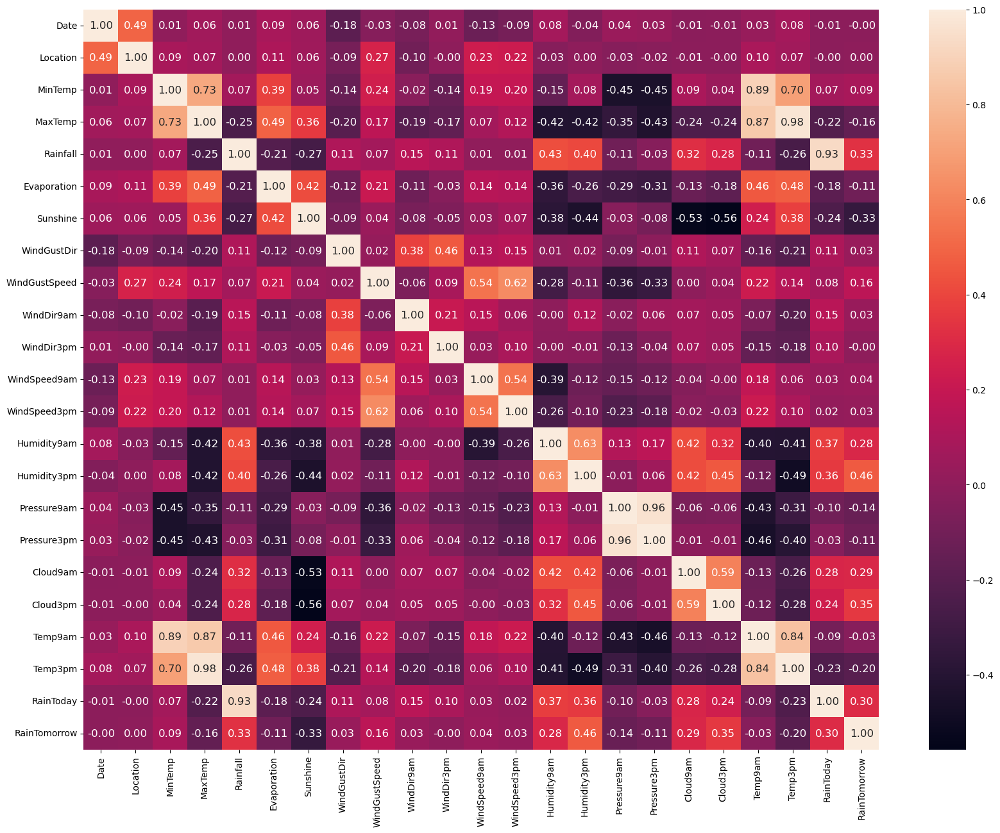

In [64]:
# Visualizing it
plt.figure(figsize=(20, 15))
sns.heatmap(df_cor, annot=True, fmt='.2F', annot_kws={"size": 12})
plt.show()


Strong Positive Correlations:

'MaxTemp' and 'Temp3pm' have a high positive correlation of 0.975189.
'Temp9am' and 'Temp3pm' also show a strong positive correlation of 0.835134.
'Pressure9am' and 'Pressure3pm' have a strong positive correlation of 0.961787.
'MinTemp' and 'Temp9am' exhibit a strong positive correlation of 0.892863.


Strong Negative Correlations: 

'Humidity9am' and 'Sunshine' show a significant negative correlation of -0.380269.
'Humidity3pm' and 'Sunshine' also have a notable negative correlation of -0.436820.

In [65]:
#Highly correlated with each other
correlation_threshold = 0.85
mask = df_cor.abs() >= correlation_threshold
features_to_drop = set()
for i in range(len(df_cor.columns)):
    for j in range(i+1, len(df_cor.columns)):
        if mask.iloc[i, j]:
            colname_i = df_cor.columns[i]
            colname_j = df_cor.columns[j]
            if colname_i not in features_to_drop:
                features_to_drop.add(colname_j)

In [66]:
# Calling the function:
features_to_drop

{'Pressure3pm', 'RainToday', 'Temp3pm', 'Temp9am'}

In [67]:
# dropping irrelevant columns
df.drop(columns=['Pressure3pm', 'Temp3pm', 'Temp9am', 'RainToday'],axis=1,inplace=True)

In [68]:
df.shape # checking the shape after dropping correlated columns

(6405, 19)

It is evident that 4 of the columns in the dataframe have a high correlation of 85% or more with each other, so we have dropped those columns. Now, we have 21 columns and 6405 rows in our dataframe.

### Copying dataframe as we have two problem statement

In [69]:
# Copying dataframe
df1 = df.copy()

We have duplicated our dataset, with the original being referred to as 'df' for RainfallTommorrow analysis, and the duplicate named 'df1' for amount of rainfall analysis. This separation allows us to work on two distinct target variables: Rainfall Prediction and Rainfall Amount

In [70]:
#correlation with target column(RainTomorrow)
correlation_with_RainTomorrow = df.corr()['RainTomorrow'].abs().sort_values(ascending=False)
print(correlation_with_RainTomorrow)


RainTomorrow     1.000000
Humidity3pm      0.463724
Cloud3pm         0.350736
Sunshine         0.333100
Rainfall         0.329587
Cloud9am         0.286797
Humidity9am      0.283625
WindGustSpeed    0.163852
MaxTemp          0.158306
Pressure9am      0.139487
Evaporation      0.111478
MinTemp          0.092327
WindSpeed9am     0.041446
WindDir9am       0.034460
WindGustDir      0.033716
WindSpeed3pm     0.026138
Date             0.004502
Location         0.001047
WindDir3pm       0.000168
Name: RainTomorrow, dtype: float64


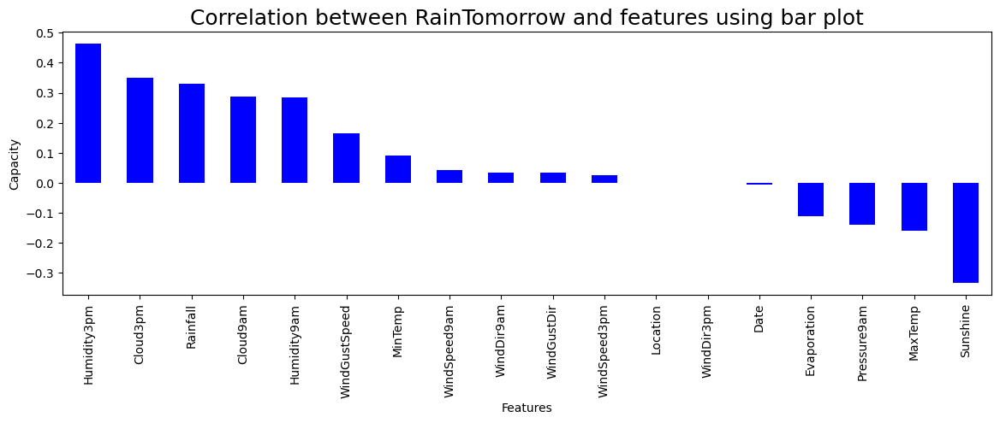

In [71]:
plt.figure(figsize=(14,4))
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='blue')
plt.xlabel('Features',fontsize=10)
plt.ylabel('Capacity',fontsize=10)
plt.title('Correlation between RainTomorrow and features using bar plot',fontsize=18)
plt.show()


In [75]:
# dropping irrelevant columns
df.drop(columns=['WindDir3pm','Location', 'Date'],axis=1,inplace=True)

In [76]:
df.shape

(6405, 16)

Dropped Columns Based on Weak Correlation:

'WindDir3pm', 'Location','Date'  were dropped due to their weak correlations with 'RainTomorrow' (ranging from 0.000168 to 0.003892).

#### Correlation with our second Target Rainfall Amount

In [77]:
#correlation with target column(Rainfall)
correlation_with_Rainfall = df1.corr()['Rainfall'].abs().sort_values(ascending=False)
print(correlation_with_Rainfall)

Rainfall         1.000000
Humidity9am      0.425329
Humidity3pm      0.404194
RainTomorrow     0.329587
Cloud9am         0.318495
Cloud3pm         0.277897
Sunshine         0.271955
MaxTemp          0.249556
Evaporation      0.213268
WindDir9am       0.152918
WindDir3pm       0.113943
WindGustDir      0.112559
Pressure9am      0.107907
MinTemp          0.071254
WindGustSpeed    0.070265
WindSpeed3pm     0.007377
WindSpeed9am     0.007322
Date             0.006295
Location         0.003313
Name: Rainfall, dtype: float64


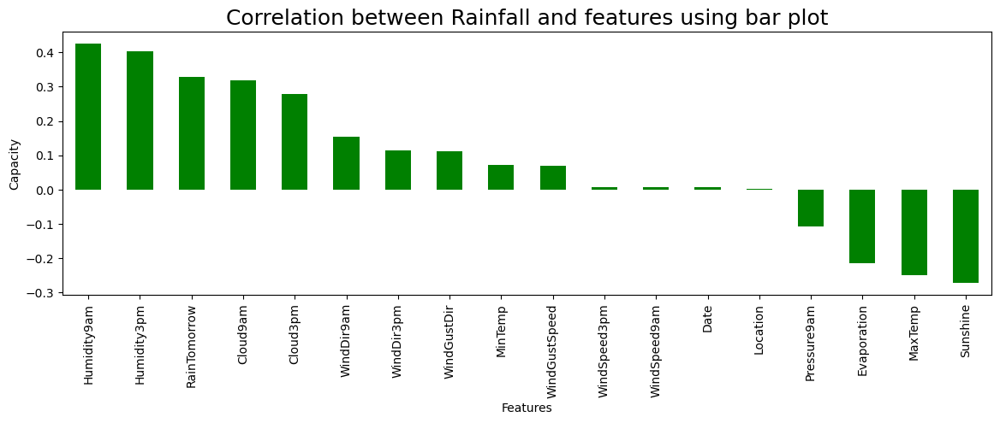

In [78]:
plt.figure(figsize=(14,4))
df1.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='green')
plt.xlabel('Features',fontsize=10)
plt.ylabel('Capacity',fontsize=10)
plt.title('Correlation between Rainfall and features using bar plot',fontsize=18)
plt.show()

In [79]:
# dropping irrelevant columns
df1.drop(columns=[ 'WindSpeed3pm', 'WindSpeed9am','Date', 'Location'],axis=1,inplace=True)
df1.shape

(6405, 15)

Dropped Columns:
'WindSpeed3pm', 'WindSpeed9am','Date', 'Location' were dropped from the dataset. These columns had weak correlations with 'Rainfall' and were considered less influential for predicting rainfall.

# Data Splitting for features & label

### Data splitting for Rainfall Tommorrow

In [80]:
# Splitting data in target and dependent feature
X = df.drop(['RainTomorrow'], axis =1)
Y = df['RainTomorrow']

# Checking the dimenstion of X & Y
X.shape, Y.shape

((6405, 15), (6405,))

### Data splitting for Rainfall


In [81]:
# Splitting data in target and dependent feature
X1 = df1.drop(['Rainfall'], axis =1)
Y1 = df1['Rainfall']

# Checking the dimenstion of X1 & Y1
X1.shape, Y1.shape

((6405, 14), (6405,))

### Scaling Features for our first Traget (RainTomorrow)

In [82]:

#Instantiate Standard Scaler
scaler= StandardScaler()

# Fit and transform the scaler on the features
X_scale = scaler.fit_transform(X)

# Create a DataFrame view of the scaled features after preprocessing
X = pd.DataFrame(X_scale, columns=X.columns)
X


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm
0,0.069957,-0.189586,0.802149,0.019152,-0.018878,1.222871,0.506587,1.317529,0.907717,0.757422,0.199656,-1.560526,-1.759471,1.496298,0.018004
1,-1.013228,0.175602,-0.646716,0.019152,-0.018878,1.413823,0.506587,-0.222754,-0.856432,0.536834,-1.396033,-1.395549,-1.252405,0.014970,0.018004
2,-0.020308,0.275199,-0.646716,0.019152,-0.018878,1.604776,0.669986,1.317529,0.825275,0.978010,-1.750630,-1.120587,-1.776956,0.014970,-0.982944
3,-0.688272,0.656987,-0.646716,0.019152,-0.018878,-0.495701,-1.127400,0.437367,0.070417,-0.896990,-1.336933,-1.890480,-0.028454,0.014970,0.018004
4,0.810134,1.370764,1.165262,0.019152,-0.018878,1.222871,0.261489,-1.322957,-0.408178,0.316245,0.849752,-0.955609,-1.217435,1.091917,1.604613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6400,-1.843670,-0.106589,-0.646716,0.019152,-0.018878,-1.259511,-0.555505,0.437367,0.278719,-0.676402,-0.982336,-1.450541,1.195498,0.014970,0.018004
6401,-1.699245,0.208801,-0.646716,0.019152,-0.018878,-0.113796,-1.290799,0.437367,0.278719,-0.896990,-0.686838,-1.615518,1.003162,0.014970,0.018004
6402,-1.374290,0.474392,-0.646716,0.019152,-0.018878,-0.686654,-0.065308,0.437367,-0.156543,-0.896990,-0.864137,-1.450541,0.566037,0.014970,0.018004
6403,-0.941016,0.490992,-0.646716,0.019152,-0.018878,0.459061,-0.800603,0.657407,0.278719,-1.117578,-0.982336,-1.450541,0.286277,-0.525609,-0.982944


### Scaling Features for our second Traget (Rainfall)

In [83]:
#Instantiate Standard Scaler
scaler= StandardScaler()

# Fit and transform the scaler on the features
X1_scale = scaler.fit_transform(X1)

# Create a DataFrame view of the scaled features after preprocessing
X1 = pd.DataFrame(X1_scale, columns=X1.columns)
X1


,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainTomorrow
0,0.069957,-0.189586,0.019152,-0.018878,1.222871,0.506587,1.317529,1.373286,0.199656,-1.560526,-1.759471,1.496298,0.018004,-0.535408
1,-1.013228,0.175602,0.019152,-0.018878,1.413823,0.506587,-0.222754,1.596561,-1.396033,-1.395549,-1.252405,0.014970,0.018004,-0.535408
2,-0.020308,0.275199,0.019152,-0.018878,1.604776,0.669986,1.317529,1.596561,-1.750630,-1.120587,-1.776956,0.014970,-0.982944,-0.535408
3,-0.688272,0.656987,0.019152,-0.018878,-0.495701,-1.127400,0.437367,-1.752556,-1.336933,-1.890480,-0.028454,0.014970,0.018004,-0.535408
4,0.810134,1.370764,0.019152,-0.018878,1.222871,0.261489,-1.322957,-0.189635,0.849752,-0.955609,-1.217435,1.091917,1.604613,-0.535408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6400,-1.843670,-0.106589,0.019152,-0.018878,-1.259511,-0.555505,0.437367,-1.529282,-0.982336,-1.450541,1.195498,0.014970,0.018004,-0.535408
6401,-1.699245,0.208801,0.019152,-0.018878,-0.113796,-1.290799,0.437367,-1.082733,-0.686838,-1.615518,1.003162,0.014970,0.018004,-0.535408
6402,-1.374290,0.474392,0.019152,-0.018878,-0.686654,-0.065308,0.437367,1.373286,-0.864137,-1.450541,0.566037,0.014970,0.018004,-0.535408
6403,-0.941016,0.490992,0.019152,-0.018878,0.459061,-0.800603,0.657407,-1.082733,-0.982336,-1.450541,0.286277,-0.525609,-0.982944,-0.535408


### Multicollinearity Checking

Multicollinearity for our first Target (RainTomorrow)

In [84]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X,i) for i in range(len(X.columns))]
vif["Features"] = X.columns
vif

,VIF values,Features
0,4.739989,MinTemp
1,5.511838,MaxTemp
2,1.468353,Rainfall
3,1.625433,Evaporation
4,1.988032,Sunshine
5,1.298674,WindGustDir
6,2.127301,WindGustSpeed
7,1.304946,WindDir9am
8,1.911293,WindSpeed9am
9,1.883827,WindSpeed3pm


Multicollinearity for our second Target (Rainfall)

In [85]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X1,i) for i in range(len(X1.columns))]
vif["Features"] = X1.columns
vif

,VIF values,Features
0,4.396276,MinTemp
1,5.163396,MaxTemp
2,1.609772,Evaporation
3,2.000198,Sunshine
4,1.467039,WindGustDir
5,1.364717,WindGustSpeed
6,1.283844,WindDir9am
7,1.329285,WindDir3pm
8,2.121443,Humidity9am
9,3.143478,Humidity3pm


Observations:

    There is no cause for concern regarding multicollinearity as all the features have VIF values within the acceptable threshold of 10 for both dataframe

### Balance the imbalance data

In [86]:
Y.value_counts()

0    4978
1    1427
Name: RainTomorrow, dtype: int64

In [87]:
# Initiate over-sampler
sm=SMOTE()

X,Y=sm.fit_resample(X,Y)

# Checking Value count after applying SMOTE
Y.value_counts()

0    4978
1    4978
Name: RainTomorrow, dtype: int64

# Model Selection

In [92]:
#Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

#Evaluation & Metrics
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score



Initating models for our First Target

In [93]:
# Initialize all the classification models
LR_model = LogisticRegression()
Ridge_model = RidgeClassifier()
DT_model = DecisionTreeClassifier()
KNR_model = KNeighborsClassifier()
RFR_model = RandomForestClassifier()
XGB_model = XGBClassifier()
SDG_model = SGDClassifier()
BG_model = BaggingClassifier()
ADA_model = AdaBoostClassifier()
ET_model = ExtraTreesClassifier()

# Create a list of models for iteration
classification_models = [
    (LR_model, "Logistic Regression"),
    (DT_model, "Decision Tree Classifier"),
    (KNR_model, "K-Neighbors Classifier"),
    (RFR_model, "Random Forest Classifier"),
    (ET_model, "ExtraTrees Classifier"),
    (Ridge_model, "RidgeClassifier"),
    (XGB_model, "XGBClassifier"),
    (SDG_model, "SGDClassifier"),
    (BG_model, "BaggingClassifier"),
    (ADA_model, "AdaBoostClassifier"),
]


 Best Models with Best Random State

In [94]:
 #List to store model performance dictionaries
model_performances = []

# Iterate over the models and evaluate them using cross-validation
for model, model_name in classification_models:
    best_random_state = 0
    best_accuracy = 0
    best_cv_score = 0

    for random_state in range(1, 101):
        X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=random_state)
        model.fit(X_train, Y_train)
        Y_pred = model.predict(X_test)
        accuracy = accuracy_score(Y_test, Y_pred)

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_random_state = random_state

    # Now, calculate the model's performance metrics using the best random state
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=best_random_state)
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(Y_test, Y_pred)
    conf_matrix = confusion_matrix(Y_test, Y_pred)
    classification_rep = classification_report(Y_test, Y_pred, output_dict=True)

    precision = classification_rep['weighted avg']['precision']
    recall = classification_rep['weighted avg']['recall']
    f1_score = classification_rep['weighted avg']['f1-score']
    support = classification_rep['weighted avg']['support']

    # Compute cross-validation score for the model after fitting
    cv_scores = cross_val_score(model, X, Y, cv=5)
    best_cv_score = cv_scores.mean()

    print(f"Model: {model_name}")
    print(f"Best Random State: {best_random_state}")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1-Score: {f1_score}")
    print(f"Support: {support}")
    print(f"Confusion Matrix:\n{conf_matrix}")
    print(f"Cross-Validation Score: {best_cv_score}")
    print("===" * 40)
    print(\n)

    model_performance = {
        "Model": model_name,
        "Best Random State": best_random_state,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1_score,
        "Support": support,
        "Confusion Matrix": [conf_matrix.tolist()],
        "Cross-Validation Score": best_cv_score
    }

    model_performances.append(model_performance)

# Create a DataFrame from the model performance list
model_performance_df = pd.DataFrame(model_performances)

# Sort the models by accuracy in descending order
model_performance_df = model_performance_df.sort_values(by="Accuracy", ascending=False)
model_performance_df

Model: Logistic Regression
Best Random State: 68
Accuracy: 0.7931034482758621
Precision: 0.793365311655384
Recall: 0.7931034482758621
F1-Score: 0.7929936157894366
Support: 2987.0
Confusion Matrix:
[[1230  283]
 [ 335 1139]]
Cross-Validation Score: 0.7517049110555735
Model: Decision Tree Classifier
Best Random State: 67
Accuracy: 0.8302644794107801
Precision: 0.8306748899154812
Recall: 0.8302644794107801
F1-Score: 0.8302079962667993
Support: 2987.0
Confusion Matrix:
[[1212  280]
 [ 227 1268]]
Cross-Validation Score: 0.742872091076511
Model: K-Neighbors Classifier
Best Random State: 59
Accuracy: 0.8490123870103783
Precision: 0.8609847134488284
Recall: 0.8490123870103783
F1-Score: 0.847426904595185
Support: 2987.0
Confusion Matrix:
[[1101  364]
 [  87 1435]]
Cross-Validation Score: 0.7577331425148106
Model: Random Forest Classifier
Best Random State: 22
Accuracy: 0.904586541680616
Precision: 0.9055642808489773
Recall: 0.904586541680616
F1-Score: 0.904563761214494
Support: 2987.0
Confusion

,Model,Best Random State,Accuracy,Precision,Recall,F1-Score,Support,Confusion Matrix,Cross-Validation Score
4,ExtraTrees Classifier,56,0.924339,0.924519,0.924339,0.924323,2987.0,"[[[1351, 129], [97, 1410]]]",0.844413
6,XGBClassifier,19,0.906595,0.906599,0.906595,0.906595,2987.0,"[[[1349, 142], [137, 1359]]]",0.769695
3,Random Forest Classifier,22,0.904587,0.905564,0.904587,0.904564,2987.0,"[[[1336, 178], [107, 1366]]]",0.810264
8,BaggingClassifier,90,0.871108,0.871395,0.871108,0.871071,2987.0,"[[[1331, 171], [214, 1271]]]",0.795300
2,K-Neighbors Classifier,59,0.849012,0.860985,0.849012,0.847427,2987.0,"[[[1101, 364], [87, 1435]]]",0.757733
1,Decision Tree Classifier,67,0.830264,0.830675,0.830264,0.830208,2987.0,"[[[1212, 280], [227, 1268]]]",0.742872
9,AdaBoostClassifier,44,0.822564,0.822668,0.822564,0.822593,2987.0,"[[[1273, 273], [257, 1184]]]",0.737144
5,RidgeClassifier,68,0.795447,0.796174,0.795447,0.795224,2987.0,"[[[1248, 265], [346, 1128]]]",0.753413
0,Logistic Regression,68,0.793103,0.793365,0.793103,0.792994,2987.0,"[[[1230, 283], [335, 1139]]]",0.751705
7,SGDClassifier,68,0.735521,0.748599,0.735521,0.731370,2987.0,"[[[1294, 219], [571, 903]]]",0.737142


Best Models for our First Target

In [95]:
model_performance_df.head(1)

,Model,Best Random State,Accuracy,Precision,Recall,F1-Score,Support,Confusion Matrix,Cross-Validation Score
4,ExtraTrees Classifier,56,0.924339,0.924519,0.924339,0.924323,2987.0,"[[[1351, 129], [97, 1410]]]",0.844413


### HyperParameter Tunning of top  models for our First Target

ExtraTrees Classifier

In [98]:
# Data splitting for train and test data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=56)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=ET_model, param_distributions=param_grid,
                                   n_iter=30, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the RandomizedSearchCV to find the best parameters
random_search.fit(X_train, Y_train)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a classifier with the best parameters
best_et = ExtraTreesClassifier(**best_params)

# Fit the best classifier on the training data
best_et.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred_et = best_et.predict(X_test)

# Evaluate the best model
accuracy = accuracy_score(Y_test, Y_pred_et)
print("Best Accuracy (ExtraTrees):", accuracy)

Best Accuracy (ExtraTrees): 0.9159691998660864


### For our First Target Plotting Confusion Matrix


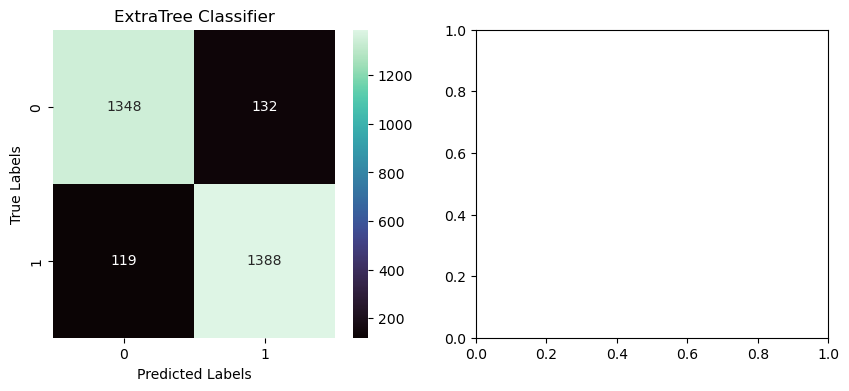

In [117]:
cm_et = confusion_matrix(Y_test, Y_pred_et)

# Create subplots for the confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot ExtraTree Classifier Confusion Matrix
sns.heatmap(cm_et, annot=True, fmt="d", cmap="mako", ax=axes[0])
axes[0].set_title('ExtraTree Classifier')
axes[0].set_xlabel('Predicted Labels')
axes[0].set_ylabel('True Labels')

plt.show()


### Saving model for our first target

In [120]:
#Saving Model
import joblib
filename = 'rainfalltomorrow_model.joblib'
joblib.dump(best_et,filename)

['rainfalltomorrow_model.joblib']

### Initating models for our Second Target

In [99]:
# Regressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Lasso,Ridge, LinearRegression, SGDRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor



In [100]:
# Initialize all the models
LR_model = LinearRegression()
RD_model = Ridge()
Lasso_model = Lasso()
DT_model = DecisionTreeRegressor()
KNR_model = KNeighborsRegressor()
RFR_model = RandomForestRegressor()
SGH_model = SGDRegressor()
Bag_model = BaggingRegressor()
GB_model = GradientBoostingRegressor()
XGB_model = XGBRegressor()
ADA_model= AdaBoostRegressor()


# Create a list of models for iteration
models = [
    (LR_model, 'Linear Regression'),
    (RD_model, 'Ridge'),
    (Lasso_model, 'Lasso'),
    (DT_model, 'Decision Tree'),
    (KNR_model, 'KNeighbors'),
    (RFR_model, 'RandomForest'),
    (SGH_model, 'SGDRegressor'),
    (Bag_model, 'Bagging Regressor'),
    (GB_model, 'GradientBoostingRegressor'),
    (XGB_model, 'XGBRegressor'),
    (ADA_model, 'AdaBoostRegressor')
]

 Best Models with Best Random State

In [101]:
# Function to check for best random state and R2 score
def maxr2_score(tec, x, y):
    max_r_score = 0
    final_r_state = 0
    for r_state in range(1, 100):
        train_x, test_x, train_y, test_y = train_test_split(x, y, random_state=r_state, test_size=0.30)
        tec.fit(train_x, train_y)
        pred = tec.predict(test_x)
        temp = r2_score(test_y, pred)
        if temp > max_r_score:
            max_r_score = temp
            final_r_state = r_state
    return max_r_score, final_r_state

In [102]:
# Create a DataFrame to store the results
results = []

# Iterate through models and calculate the best random state, R2 score, MSE, and MAE
for model, model_name in models:
    max_r2, best_random_state = maxr2_score(model, X1, Y1)
    X_train, X_test, y_train, y_test = train_test_split(X1, Y1, test_size=0.2, random_state=best_random_state)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    
    results.append({
        'Model': model_name,
        'Best R2 Score': max_r2,
        'Best Random State': best_random_state,
        'MSE': mse,
        'MAE': mae,
    })

# Create a DataFrame from the results list
results_df = pd.DataFrame(results)

# Sort the DataFrame by "Best R2 Score" in descending order
sorted_results_df = results_df.sort_values(by='Best R2 Score', ascending=False)
sorted_results_df

,Model,Best R2 Score,Best Random State,MSE,MAE
8,GradientBoostingRegressor,0.429606,77,0.564263,0.559377
5,RandomForest,0.420162,46,0.602464,0.573267
9,XGBRegressor,0.384454,12,0.589002,0.548223
7,Bagging Regressor,0.366844,46,0.643650,0.573050
1,Ridge,0.353288,77,0.644021,0.648052
0,Linear Regression,0.353276,77,0.644038,0.648049
6,SGDRegressor,0.351537,39,0.652512,0.658708
4,KNeighbors,0.306885,30,0.700896,0.578271
10,AdaBoostRegressor,0.298637,41,0.734573,0.752665
2,Lasso,0.000000,0,0.964668,0.853502


Best  Models for our Second Target

In [104]:
sorted_results_df.head(1)

,Model,Best R2 Score,Best Random State,MSE,MAE
8,GradientBoostingRegressor,0.429606,77,0.564263,0.559377


### HyperParameter Tunning of top models for our Second Target

In [108]:
#GradientBoostingRegressor
# Data Splitting for Train & Test Data
train_x, test_x, train_y, test_y = train_test_split(X1, Y1, random_state=77, test_size=0.30)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomizedSearchCV object with parallel processing
random_search = RandomizedSearchCV(estimator=GB_model, param_distributions=param_grid,
                                   n_iter=30, scoring='r2', cv=5, n_jobs=-1)

# Fit the RandomizedSearchCV to your data
random_search.fit(train_x, train_y)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a regressor with the best parameters
best_GBR = GradientBoostingRegressor(**best_params)

# Perform cross-validation to calculate the R-squared score
cv_scores = cross_val_score(best_GBR, X1, Y1, cv=5, scoring='r2')

# Fit the best regressor on the training data
best_GBR.fit(train_x, train_y)

# Make predictions on the test data
y_pred_GBR = best_GBR.predict(test_x)

# Evaluate the best model
r2_score_GBR = r2_score(test_y, y_pred_GBR)
print('Best R-squared Score (GBR):', r2_score_GBR)

mse = mean_squared_error(test_y, y_pred_GBR)
print('Mean Squared Error (MSE) (GBR):', mse)

mae = mean_absolute_error(test_y, y_pred_GBR)
print('Mean Absolute Error (MAE) (GBR):', mae)

# Print cross-validated R-squared scores
print('Cross-Validated R-squared Scores (GBR):', cv_scores.mean())

Best R-squared Score (GBR): 0.437341070188087
Mean Squared Error (MSE) (GBR): 0.5633411931024025
Mean Absolute Error (MAE) (GBR): 0.5535063831678693
Cross-Validated R-squared Scores (GBR): 0.36033574754668957


### Saving model for our Second target

In [121]:

filename = 'rainfallamount_model.joblib'
joblib.dump(best_GBR,filename)

['rainfallamount_model.joblib']